# Final Project-Pneumonia Detection Challenge using Computer Vision

### Define Utility Functions

In [ ]:
# Import necessary libraries and suppress warnings and logs for cleaner outputs
# This script provides utility functions for data analysis, validation, and evaluation of machine learning models.
# Includes data cleaning, exploration, and metric calculation methods for both classification and regression tasks.
# Additional packages to install

!pip install pydicom

import warnings
import logging
import tensorflow as tf
import absl.logging
import pandas as pd
from sklearn.metrics import precision_recall_fscore_support, accuracy_score
from time import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, mean_absolute_error, roc_auc_score, roc_curve, precision_recall_curve, auc
import os
from tqdm import tqdm
from pydicom import dcmread
from sklearn.model_selection import train_test_split
import cv2

# Suppress TensorFlow and Python warnings for cleaner logs
tf.get_logger().setLevel(logging.ERROR)
absl.logging.set_verbosity(absl.logging.ERROR)
warnings.filterwarnings('ignore')


# Initialize the DataFrame to store evaluation metrics
evaluation_metrics_dataframe = pd.DataFrame(columns=["ModelDescription", "PredictionThreshold", "AccuracyScore", "PrecisionScore", "RecallScore", "F1Score", "ModelName", "ExecutionTime"])

threshold_metrics_dataframe = pd.DataFrame(columns=['PredictionThreshold', 'AccuracyScore', 'PrecisionScore', 'RecallScore', 'F1Score'])

# Function to analyze the dataset
def analyze_dataset(data_frame):
    """
    Analyze the structure, missing values, and duplicates in the given DataFrame.
    
    Parameters:
    - data_frame: DataFrame to be analyzed
    
    Returns:
    - missing_value_details: Details of columns with missing values (if any)
    """
    print("\nDataset Shape and Structure:")
    print(f"Shape: {data_frame.shape[0]} rows, {data_frame.shape[1]} columns")

    print("\nFirst and Last 5 Rows of the Dataset:")
    display(data_frame.head())
    display(data_frame.tail())

    print("\nDataset Metadata Information:")
    data_frame.info()

    # Count missing values
    missing_values_count = data_frame.isnull().sum().sum()
    if missing_values_count > 0:
        print(f"\nMissing values detected: {missing_values_count}")
        missing_percentages = (data_frame.isnull().sum() / len(data_frame)) * 100
        missing_value_details = missing_percentages[missing_percentages > 0]
        print("\nMissing value percentages per column:")
        print(missing_value_details)
    else:
        print("\nNo missing values detected")
        missing_value_details = None

    # Count duplicates
    duplicate_count = data_frame.duplicated().sum()
    if duplicate_count > 0:
        print(f"\nDuplicate rows detected: {duplicate_count}")
    else:
        print("\nNo duplicate rows detected")

    return missing_value_details



def count_missing_values(data_frame):
    """
    Count the total number of rows with missing values in the DataFrame.

    Parameters:
    - data_frame: The DataFrame to analyze

    Returns:
    - int: Number of rows with missing values
    """
    return data_frame.isna().sum().sum()

def calculate_missing_percentages(data_frame):
    """
    Calculate the percentage of missing values for each column in the DataFrame.

    Parameters:
    - data_frame: The DataFrame to analyze

    Returns:
    - Series: Percentage of missing values per column
    """
    return (data_frame.isnull().sum() * 100) / len(data_frame)

def remove_duplicates(data_frame):
    """
    Remove duplicate rows from the DataFrame.

    Parameters:
    - data_frame: The DataFrame to process

    Returns:
    - DataFrame: A DataFrame with duplicate rows removed
    """
    return data_frame.drop_duplicates(keep='first')

def count_duplicates(data_frame):
    """
    Count the number of duplicate rows in the DataFrame.

    Parameters:
    - data_frame: The DataFrame to analyze

    Returns:
    - int: Number of duplicate rows
    """
    return data_frame.duplicated().sum()

def print_shape(data_frame):
    """
    Print the shape of the DataFrame.

    Parameters:
    - data_frame: The DataFrame to analyze
    """
    print(f"Dataset Shape: {data_frame.shape[0]} rows, {data_frame.shape[1]} columns")

def analyze_column_details(data_frame):
    """
    Analyze each column in the DataFrame to determine its categorical or numerical nature.

    Parameters:
    - data_frame: The DataFrame to analyze

    Returns:
    - DataFrame: A summary DataFrame containing details about valid categorical and numerical columns
    """
    import numpy as np

    column_summary = pd.DataFrame(columns=['ColumnName', 'UniqueClassCount', 'DataType', 'UniqueValues', 'UniqueValueCounts'])

    for idx, column in enumerate(data_frame.columns):
        # Skip columns with unhashable types (e.g., lists, sets, dicts)
        if data_frame[column].apply(lambda x: isinstance(x, (list, set, dict))).any():
            continue  # Skip this column

        # Process hashable columns
        unique_values = data_frame[column].dropna().unique()
        unique_value_count = len(unique_values)
        data_type = data_frame[column].dtype

        column_summary.loc[idx] = [
            column,
            unique_value_count,
            data_type,
            unique_values,
            data_frame[column].value_counts().values
        ]

    # Reset index for the resulting DataFrame
    return column_summary.reset_index(drop=True)

def describe_dataset(data_frame):
    """
    Provide an extended statistical summary of the DataFrame.

    Parameters:
    - data_frame: The DataFrame to describe

    Returns:
    - DataFrame: A statistical summary with additional metrics
    """
    description = data_frame.describe().transpose()
    description['CoefficientOfVariation'] = description['std'] / description['mean']
    description['Skewness'] = (3 * (description['mean'] - description['50%'])) / description['std']
    description['InterQuartileRange'] = description['75%'] - description['25%']
    description['LowerFence'] = description['25%'] - 1.5 * description['InterQuartileRange']
    description['UpperFence'] = description['75%'] + 1.5 * description['InterQuartileRange']
    description['OutlierPercentage'] = (description['max'] - description['min']) / (description['UpperFence'] - description['LowerFence'])

    return description.transpose()


### 1. Milestone 1: [ Score: 40 points]
####  Input: Context and Dataset
###  Process:
####  Step 1: Import the data. [ 3 points ]


In [3]:
import numpy as np
import pandas as pd
import pydicom
import os
from tqdm import tqdm
import pickle

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
# Function to extract all files from a zip archive
from zipfile import ZipFile
def extract_all_from_zip(zip_file_path, extract_dir):
    """
    Extracts all files from a zip archive to the specified directory.

    Parameters:
    - zip_file_path: Path to the zip file to extract
    - extract_dir: Directory where files will be extracted
    """
    with ZipFile(zip_file_path, 'r') as zip_object:
        list_of_file_names = zip_object.namelist()

        # Extract each file in progress bar
        for file_name in tqdm(list_of_file_names, desc=f"Extracting {zip_file_path}"):
            zip_object.extract(member=file_name, path=extract_dir)


In [ ]:
# Load the labels and class information from CSV files
train_labels_df = pd.read_csv('stage_2_train_labels.csv')
test_labels_df = pd.read_csv('stage_2_sample_submission.csv')
class_info_df = pd.read_csv('stage_2_detailed_class_info.csv')

# Define constants for image dimensions and training setup
original_image_size = 1024  # DICOM image original size
input_image_size = 224  # Size of input images for processing
batch_size = 16  # Batch size for training
epochs = 12  # Number of epochs for model training

# Define paths for images (based on zip files)
train_zip_file = 'stage_2_train_images.zip'
test_zip_file = 'stage_2_test_images.zip'

train_extract_dir = 'stage_2_train_images'
test_extract_dir = 'stage_2_test_images'

# Ensure directories exist
os.makedirs(train_extract_dir, exist_ok=True)
os.makedirs(test_extract_dir, exist_ok=True)

# Extract all files from train and test zip files
extract_all_from_zip(train_zip_file, train_extract_dir)
extract_all_from_zip(test_zip_file, test_extract_dir)

# Define paths to nested directories containing DICOM files
nested_train_images_dir = os.path.join(train_extract_dir, "stage_2_train_images")
nested_test_images_dir = os.path.join(test_extract_dir, "stage_2_test_images")

# Verify extracted files
print("Files in Train Nested Directory:", os.listdir(nested_train_images_dir)[:10])
print("Files in Test Nested Directory:", os.listdir(nested_test_images_dir)[:10])


In [6]:
# Define additional constants and paths
color_mo
de = 'RGB'  # 'L' for grayscale (use 'RGB' for color images)
class_count = 2
unique_identifier = str(input_image_size) + color_mode + str(class_count)

# Define paths for converted PNG files to be used for directory-based data loading
training_png_directory = 'train_images' + unique_identifier
validation_png_directory = 'val_images' + unique_identifier
testing_png_directory = 'test_images' + unique_identifier

# Define labels for binary and ternary classification tasks
binary_class_labels = ['No_Opacity', 'Opacity']
ternary_class_labels = ['Normal', 'No_Opacity_Not_Normal', 'Opacity']

# Ensure DICOM images are extracted
if not os.path.exists(train_extract_dir):
    extract_all_from_zip(train_zip_file, train_extract_dir)

if not os.path.exists(test_extract_dir):
    extract_all_from_zip(test_zip_file, test_extract_dir)

In [7]:
class_info_df.head(10)

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
5,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
6,00569f44-917d-4c86-a842-81832af98c30,No Lung Opacity / Not Normal
7,006cec2e-6ce2-4549-bffa-eadfcd1e9970,No Lung Opacity / Not Normal
8,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity
9,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity


In [8]:
# Display the value counts of the 'class' column in the class_info_df
print(class_info_df['class'].value_counts())

class
No Lung Opacity / Not Normal    11821
Lung Opacity                     9555
Normal                           8851
Name: count, dtype: int64


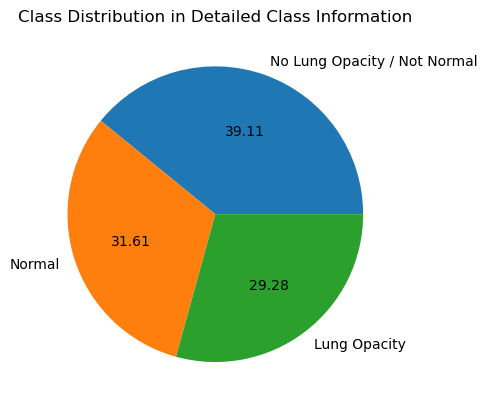

In [9]:
# Plot a pie chart for the distribution of classes in class_info_df
plt.pie(class_info_df['class'].value_counts(), autopct='%.2f', labels=class_info_df['class'].unique())
plt.title('Class Distribution in Detailed Class Information')
plt.show()

### **Observations:**

- The 'stage_2_detailed_class_info.csv' assigns one of three classes: 'No Lung Opacity / Not Normal', 'Normal', 'Lung Opacity' to each image.

- Some images are assigned multiple classes, indicating multiple bounding boxes for the same image.

- The class imbalance is not severe when considering the three classes.


In [10]:
# Display the first 10 rows of the train_labels_df to understand its structure
print(train_labels_df.head(10))

                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1
5  00436515-870c-4b36-a041-de91049b9ab4  562.0  152.0  256.0   453.0       1
6  00569f44-917d-4c86-a842-81832af98c30    NaN    NaN    NaN     NaN       0
7  006cec2e-6ce2-4549-bffa-eadfcd1e9970    NaN    NaN    NaN     NaN       0
8  00704310-78a8-4b38-8475-49f4573b2dbb  323.0  577.0  160.0   104.0       1
9  00704310-78a8-4b38-8475-49f4573b2dbb  695.0  575.0  162.0   137.0       1


### **Observations:**

- The 'stage_2_train_labels.csv' specifies the region of interest (bounding box) for each image.

- If the diagnosis is 'No Lung Opacity / Not Normal' or 'Normal', no bounding boxes are specified, and the Target value is set to 0.

- If 'Lung Opacity' is diagnosed, bounding box coordinates are provided, and the Target value is set to 1.

- Multiple bounding boxes can exist for a single image, leading to duplicate patientId entries in both class_info and train_labels.

In [11]:
# Display the value counts of the 'Target' column in the train_labels_df
print(train_labels_df['Target'].value_counts())

Target
0    20672
1     9555
Name: count, dtype: int64


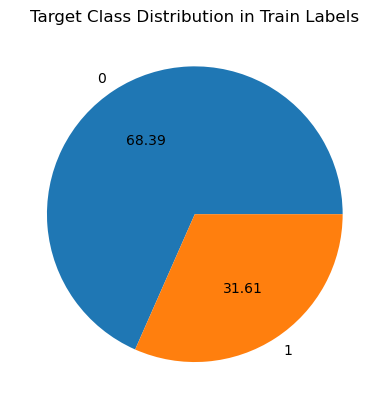

In [12]:
# Plot a pie chart for the distribution of the 'Target' values in train_labels_df
plt.pie(train_labels_df['Target'].value_counts(), autopct='%.2f', labels=train_labels_df['Target'].unique())
plt.title('Target Class Distribution in Train Labels')
plt.show()

In [13]:
# Checking the shapes of the dataframes
print(f'Train labels shape = {train_labels_df.shape}, Test labels shape = {test_labels_df.shape}, Classes shape = {class_info_df.shape}')

Train labels shape = (30227, 6), Test labels shape = (3000, 2), Classes shape = (30227, 2)


In [14]:
# Count the number of unique patient records in train_labels and class_info
unique_train_records = train_labels_df['patientId'].nunique()
unique_class_info_records = class_info_df['patientId'].nunique()
print(f'Unique images in train_labels = {unique_train_records}, Unique images in class_info = {unique_class_info_records}')

Unique images in train_labels = 26684, Unique images in class_info = 26684


### ***Observations:***

- Train dataset contains 26,684 unique training images.

- However, the train_labels and class_info datasets have 30,227 records, indicating multiple bounding boxes for some images.

- The test dataset contains 3,000 test images.

- Both train_labels and class_info have records for 26,684 unique images, which matches the total number of training images.

- The stage_2_sample_submission.csv contains only test images and specifies the format for expected output.



####  Step 2: Map training and testing images to its classes. [ 4 points ]


In [15]:
# Map training and testing images to their respective classes

# Create a dictionary to map patient IDs to their target class for training data
training_target_mapping = train_labels_df.groupby('patientId')['Target'].apply(list).to_dict()

# Create a dictionary to map patient IDs to their class information for training data
training_class_info_mapping = class_info_df.groupby('patientId')['class'].apply(list).to_dict()




In [53]:
import itertools

# Function to display the first 5 items of a dictionary
def first5rows(dictionary):
    """
    Print the first 5 items of a dictionary as a DataFrame.

    Parameters:
    - dictionary: The dictionary to display

    Returns:
    - None
    """
    first_five_items = pd.DataFrame(itertools.islice(dictionary.items(), 5))
    display(first_five_items)


In [17]:
first5rows(training_target_mapping)

,0,1
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,[0]
1,000924cf-0f8d-42bd-9158-1af53881a557,[0]
2,000db696-cf54-4385-b10b-6b16fbb3f985,"[1, 1]"
3,000fe35a-2649-43d4-b027-e67796d412e0,"[1, 1]"
4,001031d9-f904-4a23-b3e5-2c088acd19c6,"[1, 1]"


In [18]:
first5rows(training_class_info_mapping)

,0,1
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,[No Lung Opacity / Not Normal]
1,000924cf-0f8d-42bd-9158-1af53881a557,[Normal]
2,000db696-cf54-4385-b10b-6b16fbb3f985,"[Lung Opacity, Lung Opacity]"
3,000fe35a-2649-43d4-b027-e67796d412e0,"[Lung Opacity, Lung Opacity]"
4,001031d9-f904-4a23-b3e5-2c088acd19c6,"[Lung Opacity, Lung Opacity]"


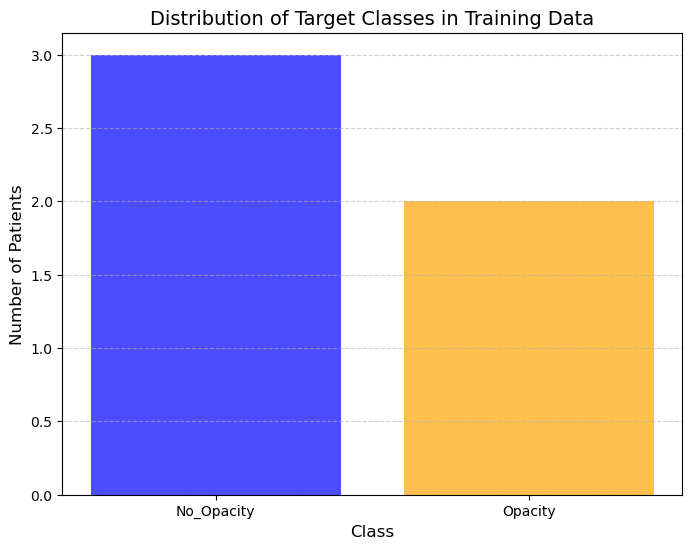

In [19]:
# Simulated data
training_class_info_mapping = {
    "patient_1": ["No_Opacity"],
    "patient_2": ["Opacity"],
    "patient_3": ["No_Opacity"],
    "patient_4": ["Opacity"],
    "patient_5": ["No_Opacity"],
}

# Count the number of patients in each class
target_counts = {"No_Opacity": 0, "Opacity": 0}
for target in training_class_info_mapping.values():
    target_counts[target[0]] += 1

# Create a bar chart for target class distribution
plt.figure(figsize=(8, 6))
plt.bar(target_counts.keys(), target_counts.values(), color=['blue', 'orange'], alpha=0.7)
plt.title("Distribution of Target Classes in Training Data", fontsize=14)
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Patients", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()


####  Step 3: Map training and testing images to its annotations. [ 4 points ]

In [20]:
print(train_labels_df.head())
print(test_labels_df.head())

                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1
                              patientId PredictionString
0  0000a175-0e68-4ca4-b1af-167204a7e0bc  0.5 0 0 100 100
1  0005d3cc-3c3f-40b9-93c3-46231c3eb813  0.5 0 0 100 100
2  000686d7-f4fc-448d-97a0-44fa9c5d3aa6  0.5 0 0 100 100
3  000e3a7d-c0ca-4349-bb26-5af2d8993c3d  0.5 0 0 100 100
4  00100a24-854d-423d-a092-edcf6179e061  0.5 0 0 100 100


In [21]:
# Step 3: Map training and testing images to their annotations

# Filter out rows with missing values and group bounding box annotations for training data
bounding_boxes_train = train_labels_df.dropna()\
                                     .groupby('patientId')[['x', 'y', 'width', 'height']]\
                                     .apply(lambda x: x.values.tolist()).reset_index()

bounding_boxes_train = bounding_boxes_train.rename(columns={0: "bboxes"})

# Create a dictionary mapping patient IDs to their bounding boxes for training data
train_annotations_dict = dict(zip(bounding_boxes_train['patientId'], bounding_boxes_train["bboxes"]))

# Process testing data using PredictionString for bounding box extraction
def parse_prediction_string(pred_string):
    """
    Parse the PredictionString column to extract bounding box details.
    """
    if isinstance(pred_string, str):
        values = list(map(float, pred_string.split()))
        return [values[i:i + 4] for i in range(0, len(values), 4)]
    else:
        return []

bounding_boxes_test = test_labels_df[['patientId', 'PredictionString']].copy()
bounding_boxes_test['bboxes'] = bounding_boxes_test['PredictionString'].apply(parse_prediction_string)

# Create a dictionary mapping patient IDs to their bounding boxes for testing data
test_annotations_dict = dict(zip(bounding_boxes_test['patientId'], bounding_boxes_test['bboxes']))

# Display a sample of training annotations
print("Sample training annotations:")
first5rows(train_annotations_dict)

# Display a sample of testing annotations
print("Sample testing annotations:")
first5rows(test_annotations_dict)


Sample training annotations:


,0,1
0,000db696-cf54-4385-b10b-6b16fbb3f985,"[[316.0, 318.0, 170.0, 478.0], [660.0, 375.0, ..."
1,000fe35a-2649-43d4-b027-e67796d412e0,"[[570.0, 282.0, 269.0, 409.0], [83.0, 227.0, 2..."
2,001031d9-f904-4a23-b3e5-2c088acd19c6,"[[66.0, 160.0, 373.0, 608.0], [552.0, 164.0, 3..."
3,001916b8-3d30-4935-a5d1-8eaddb1646cd,"[[198.0, 375.0, 114.0, 206.0]]"
4,0022073f-cec8-42ec-ab5f-bc2314649235,"[[575.0, 232.0, 246.0, 528.0], [161.0, 230.0, ..."


Sample testing annotations:


,0,1
0,0000a175-0e68-4ca4-b1af-167204a7e0bc,"[[0.5, 0.0, 0.0, 100.0], [100.0]]"
1,0005d3cc-3c3f-40b9-93c3-46231c3eb813,"[[0.5, 0.0, 0.0, 100.0], [100.0]]"
2,000686d7-f4fc-448d-97a0-44fa9c5d3aa6,"[[0.5, 0.0, 0.0, 100.0], [100.0]]"
3,000e3a7d-c0ca-4349-bb26-5af2d8993c3d,"[[0.5, 0.0, 0.0, 100.0], [100.0]]"
4,00100a24-854d-423d-a092-edcf6179e061,"[[0.5, 0.0, 0.0, 100.0], [100.0]]"


### **Details of Preprocessing and Visualization**

### **Preprocessing**

Preprocessing is essential to prepare data for analysis or training. Here are the steps involved:

***Resize Images:***

Convert images from their original size (e.g., 1024x1024 pixels) to a fixed size (e.g., 224x224 pixels) for uniformity.

***Class Distribution:***

Visualize the number of images per class using bar plots or pie charts.


***Bounding Box Check:***

Overlay bounding boxes on images to ensure correctness.

***Image Samples:***

Display sample images for each class along with their bounding boxes (if applicable).

***Normalization:***

Scale pixel values to the range [0, 1] for numerical stability.
Color Mode Conversion:

Convert DICOM grayscale images to RGB (if needed).
Bounding Box Adjustment:

Adjust the bounding box coordinates based on the resizing ratio.
Class Balancing:

Handle class imbalance by oversampling minority classes or undersampling majority classes.

***Visualization***

Visualization helps to understand the dataset distribution and verify preprocessing. The steps include:




####  Step 4: Preprocessing and Visualisation of different classes [4 Points]

In [22]:
# Step 4: Preprocessing and Visualization of Different Classes

# Define helper functions useful in creating a metadata DataFrame

# Function to join all strings in a list (used for converting list in a column to text)
def concatenate_class_info(class_info_list):
    """
    Concatenate all strings in a given list into a single string.

    Parameters:
    - class_info_list: List of strings representing class information

    Returns:
    - str: Concatenated string of class information
    """
    if class_info_list is not None:
        return ' '.join(class_info_list)
    return None

# Function to map 'class_info_text' to a numerical label
def convert_class_info_to_label(class_info_text):
    """
    Map class information text to a numerical label.

    Parameters:
    - class_info_text: Text representing class information

    Returns:
    - int: Numerical label for the class
        - 0 for 'Normal'
        - 1 for 'No Lung Opacity / Not Normal'
        - 2 for other cases
        - None for missing information
    """
    if class_info_text == 'Normal':
        return 0
    elif class_info_text == 'No Lung Opacity / Not Normal':
        return 1
    elif class_info_text is None:
        return None
    else:
        return 2


In [23]:
# The header of a typical DICOM image
# Define the nested directory for training images
nested_train_images_dir = os.path.join(train_extract_dir, "stage_2_train_images")

# Get all DICOM file paths from the nested directory
training_dicom_files = [
    os.path.join(root, file)
    for root, _, files in os.walk(nested_train_images_dir)
    for file in files if file.endswith(".dcm")
]

# Load a sample DICOM image
if len(training_dicom_files) > 0:
    sample_training_images = [pydicom.dcmread(file_path) for file_path in training_dicom_files[:1]]

    # Display the header of the first DICOM image
    print("Header of the first DICOM image:")
    print(sample_training_images[0])
else:
    print("No DICOM files found in the nested directory.")



Header of the first DICOM image:
Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008, 0020) Study Date                          DA: '190101

### Meta data

In this step, we consolidate all relevant information into a single DataFrame. This DataFrame will contain unique records for each training and testing image. If an image has multiple bounding boxes, all bounding boxes will be stored as a list within the DataFrame. Additionally, the DataFrame will include records for test images.

For data that is unavailable, values will be set to `None` and populated later based on the output of the trained model. The metadata will also incorporate additional information extracted from DICOM images, providing a comprehensive dataset for further analysis.


## Observations

1. The patient's sex and age were analyzed as part of the interim report submission.
2. Additional parameters will be explored below to enhance the accuracy of the model.
3. Key observations regarding the dataset and image processing:
   a. The DICOM images in the dataset are already lossy compressed. Therefore, converting them to PNG format will not lead to significant information loss.
   b. The photometric interpretation of the images is Monochrome2, where the minimum pixel value represents black when displayed. Consequently, while normalizing the images, this detail must be accounted for. Further discussion on the significance of this parameter is provided below.



### Convert images to PNG format and save them in directories structured for compatibility.

### Additionally, create a metadata DataFrame by combining information from the provided CSV files and the DICOM image headers.


In [24]:
import os
import shutil
import pandas as pd
import numpy as np
from pydicom import dcmread
from PIL import Image
from skimage import exposure

# Define paths for converted PNG files to be used for directory-based data loading
training_png_directory = 'train_images' + unique_identifier
validation_png_directory = 'val_images' + unique_identifier
testing_png_directory = 'test_images' + unique_identifier

# Define labels for binary and ternary classification tasks
binary_class_labels = ['No_Opacity', 'Opacity']
ternary_class_labels = ['Normal', 'No_Opacity_Not_Normal', 'Opacity']

# Function to convert DICOM images to PNG format and save them in structured directories

def convert_and_save_image(filename, dicom_dataset, num_classes, label, dataset_type, image_dimensions=(input_image_size, input_image_size), color_mode='L'):
    """
    Convert a DICOM image to PNG format, normalize, resize, and save it in a structured directory.

    Parameters:
    - filename: Name of the file (without extension)
    - dicom_dataset: Loaded DICOM dataset object
    - num_classes: Number of classes for classification (2 for binary, 3 for ternary)
    - label: Class label of the image (if available)
    - dataset_type: Dataset category ('train', 'val', or 'test')
    - image_dimensions: Target dimensions for the image
    - color_mode: Color mode for conversion ('L' for grayscale, 'RGB' for color)

    Returns:
    - str: Path to the directory where the image is saved
    """
    # Convert the DICOM pixel array to an image
    image = Image.fromarray(dicom_dataset.pixel_array).convert(color_mode)

    # Resize the image to the specified dimensions
    image = image.resize(image_dimensions)

    # Normalize pixel values
    image = (np.array(image) - np.min(image)) / 255.0

    # Determine the directory to save the image
    if num_classes == 2:
        if label is not None:  # Label corresponds to binary classification
            class_dir = os.path.join(training_png_directory if dataset_type == 'train' else validation_png_directory, binary_class_labels[label])
        else:
            class_dir = os.path.join(testing_png_directory)
    else:
        if label is not None:  # Label corresponds to ternary classification
            class_dir = os.path.join(training_png_directory if dataset_type == 'train' else validation_png_directory, ternary_class_labels[label])
        else:
            class_dir = os.path.join(testing_png_directory)

    # Create the class directory if it doesn't exist
    os.makedirs(class_dir, exist_ok=True)

    # Save the image as PNG
    save_path = os.path.join(class_dir, filename + '.png')
    Image.fromarray((image * 255).astype(np.uint8)).save(save_path)

    return save_path


In [25]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import pydicom
from pydicom import dcmread
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# Define validation split ratio
validation_split_ratio = 0.2

# Define additional constants and paths
color_mode = 'RGB'  # 'L' for grayscale
class_count = 2
unique_identifier = str(input_image_size) + color_mode + str(class_count)
training_png_directory = 'train_images' + unique_identifier
validation_png_directory = 'val_images' + unique_identifier
testing_png_directory = 'test_images' + unique_identifier

# Map patient IDs to target classes
train_class_dict = train_labels_df.groupby('patientId')['Target'].apply(list).to_dict()

# Map patient IDs to class information
train_class_info_dict = class_info_df.groupby('patientId')['class'].apply(list).to_dict()

# Map patient IDs to bounding box annotations
bounding_boxes_train = train_labels_df.dropna(subset=['x', 'y', 'width', 'height']) \
    .groupby('patientId')[['x', 'y', 'width', 'height']] \
    .apply(lambda x: x.values.tolist()) \
    .reset_index()
bounding_boxes_train = bounding_boxes_train.rename(columns={0: "boundingBoxes"})
train_annotations_dict = dict(zip(bounding_boxes_train['patientId'], bounding_boxes_train['boundingBoxes']))

# Define labels for classification tasks
binary_class_labels = ['No_Opacity', 'Opacity']
ternary_class_labels = ['Normal', 'No_Opacity_Not_Normal', 'Opacity']

# Define paths for images
nested_train_images_dir = os.path.join(train_extract_dir, "stage_2_train_images")
nested_test_images_dir = os.path.join(test_extract_dir, "stage_2_test_images")

# Initialize ViewPosition column if it doesn't exist
if 'ViewPosition' not in train_labels_df.columns:
    train_labels_df['ViewPosition'] = np.nan

# Prepare the metadata dictionary
metadata_dict = {
    'patientId': [], 'patientSex': [], 'patientAge': [], 'imageWidth': [], 'imageHeight': [],
    'classLabel': [], 'numBoundingBoxes': [], 'boundingBoxes': [], 'classInfo': [], 'classInfoText': [],
    'binaryLabel': [], 'ternaryLabel': [], 'datasetType': [], 'imageFolder': [], 'modality': [],
    'examinedBodyPart': [], 'viewPosition': [], 'conversionType': [], 'pixelSpacing': [],
    'photometricInterpretation': [], 'samplesPerPixel': [], 'lossyImageCompression': [],
    'lossyCompressionMethod': [], 'pixelRepresentation': []
}

# Filter unique patient IDs for training and testing
unique_train_labels = train_labels_df.drop_duplicates(subset='patientId', keep='first')
train_patient_ids = unique_train_labels['patientId']
train_targets = unique_train_labels['Target']
test_patient_ids = test_labels_df['patientId']

# Split filenames into training and validation sets
train_files, val_files, train_labels, val_labels = train_test_split(
    train_patient_ids, train_targets, stratify=train_targets, test_size=validation_split_ratio, random_state=42
)

# Process each image and populate metadata
for dataset_type, patient_list in [('train', train_files), ('val', val_files), ('test', test_patient_ids)]:
    for patient_id in tqdm(patient_list, desc=dataset_type):
        image_directory = nested_train_images_dir if dataset_type != 'test' else nested_test_images_dir
        dicom_image = dcmread(os.path.join(image_directory, patient_id + '.dcm'))

        # Extract metadata from the DICOM image
        height, width = dicom_image.Rows, dicom_image.Columns
        metadata_dict['patientId'].append(dicom_image.PatientID)
        metadata_dict['patientSex'].append(dicom_image.PatientSex)
        metadata_dict['patientAge'].append(dicom_image.PatientAge)
        metadata_dict['imageWidth'].append(width)
        metadata_dict['imageHeight'].append(height)
        metadata_dict['modality'].append(dicom_image.Modality)
        metadata_dict['lossyImageCompression'].append(pd.to_numeric(dicom_image.get('LossyImageCompression', None)))
        metadata_dict['lossyCompressionMethod'].append(dicom_image.get('LossyImageCompressionMethod', None))
        metadata_dict['examinedBodyPart'].append(dicom_image.get('BodyPartExamined', None))
        metadata_dict['viewPosition'].append(dicom_image.get('ViewPosition', None))
        metadata_dict['conversionType'].append(dicom_image.get('ConversionType', None))
        metadata_dict['samplesPerPixel'].append(dicom_image.get('SamplesPerPixel', None))
        metadata_dict['photometricInterpretation'].append(dicom_image.get('PhotometricInterpretation', None))
        metadata_dict['pixelSpacing'].append(
            str.format("{:4.3f}", dicom_image.PixelSpacing[0]) if hasattr(dicom_image, 'PixelSpacing') else None
        )
        metadata_dict['pixelRepresentation'].append(dicom_image.get('PixelRepresentation', None))

        # Assign class label, bounding boxes, and additional info
        if dataset_type != 'test':
            class_label = train_class_dict.get(dicom_image.PatientID, None)
            class_info = train_class_info_dict.get(dicom_image.PatientID, None)
            class_info_text = concatenate_class_info(list(set(class_info))) if class_info else None
            num_boxes = len(train_annotations_dict.get(dicom_image.PatientID, []))
            bounding_boxes = train_annotations_dict.get(dicom_image.PatientID, [])
            binary_label = class_label[0] if class_label else None
            ternary_label = convert_class_info_to_label(class_info_text)

            # Update 'ViewPosition' in training labels
            train_labels_df.loc[train_labels_df['patientId'] == dicom_image.PatientID, 'ViewPosition'] = dicom_image.ViewPosition
        else:
            # For test images, these values are unavailable
            class_label = None
            class_info = None
            class_info_text = None
            num_boxes = None
            binary_label = None
            ternary_label = None
            bounding_boxes = None

        metadata_dict['classLabel'].append(class_label)
        metadata_dict['numBoundingBoxes'].append(num_boxes)
        metadata_dict['boundingBoxes'].append(bounding_boxes)
        metadata_dict['classInfo'].append(class_info)
        metadata_dict['classInfoText'].append(class_info_text)
        metadata_dict['binaryLabel'].append(binary_label)
        metadata_dict['ternaryLabel'].append(ternary_label)
        metadata_dict['datasetType'].append(dataset_type)

        # Save the converted PNG images
        if class_count == 2:
            metadata_dict['imageFolder'].append(convert_and_save_image(patient_id, dicom_image, class_count, binary_label, dataset_type,
                                                                        image_dimensions=(input_image_size, input_image_size),
                                                                        color_mode=color_mode))
        else:
            metadata_dict['imageFolder'].append(convert_and_save_image(patient_id, dicom_image, class_count, ternary_label, dataset_type,
                                                                        image_dimensions=(input_image_size, input_image_size),
                                                                        color_mode=color_mode))

# Convert the metadata dictionary to a pandas DataFrame
metadata_df = pd.DataFrame(metadata_dict)


test: 100%|████████████████████████████████████████████████████████████████████████| 3000/3000 [03:46<00:00, 13.24it/s]


In [27]:
metadata_df

,patientId,patientSex,patientAge,imageWidth,imageHeight,classLabel,numBoundingBoxes,boundingBoxes,classInfo,classInfoText,...,modality,examinedBodyPart,viewPosition,conversionType,pixelSpacing,photometricInterpretation,samplesPerPixel,lossyImageCompression,lossyCompressionMethod,pixelRepresentation
0,9c71c1ec-b6e6-46b1-89e1-398f921d7485,M,25,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
1,817a8977-7598-427a-92f7-57833c22e5fa,M,60,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
2,08fa5211-04ae-4150-b006-9683187f67d3,M,57,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
3,ec55e4ab-ecdd-4265-a5fa-d84ee0af1e0d,F,62,1024,1024,"[1, 1]",2.0,"[[168.0, 362.0, 153.0, 170.0], [576.0, 224.0, ...","[Lung Opacity, Lung Opacity]",Lung Opacity,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
4,6b10737e-ec37-4f37-8db3-a95434db6016,M,54,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29679,c1e88810-9e4e-4f39-9306-8d314bfc1ff1,F,10,1024,1024,None,NaN,None,None,None,...,CR,CHEST,AP,WSD,0.139,MONOCHROME2,1,1,ISO_10918_1,0
29680,c1ec035b-377b-416c-a281-f868b7c9b6c3,M,74,1024,1024,None,NaN,None,None,None,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
29681,c1ef5b66-0fd7-49d1-ae6b-5af84929414b,M,58,1024,1024,None,NaN,None,None,None,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
29682,c1ef6724-f95f-40f1-b25b-de806d9bc39d,M,36,1024,1024,None,NaN,None,None,None,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0


In [28]:
# Save the metadata DataFrame to a CSV file
metadata_filename = 'metadata.csv'
metadata_df.to_csv(metadata_filename, index=False)
print(f"Metadata saved to {metadata_filename}")

Metadata saved to metadata.csv


## EDA Section

In this section, we will familiarize ourselves with the data and use visualizations to address the following key questions:

1. ***Target Distribution***: How are the targets distributed? Given the choice between binary classification and three-class classification, we evaluated the pros and cons of each. Following the interim report, binary classification was chosen, and the same approach has been implemented below. The imbalance in the dataset has been managed through:
   - Data augmentation
   - Incorporating recall as a metric during training

2. ***DICOM Header Information***: Can patient-specific details from the DICOM image header, such as sex and age, be utilized for classification?

3. ***Bounding Box Distribution***: How are the number of bounding boxes distributed across the dataset?

4. ***Image Format Consistency***: Are all images in the dataset in the same format?

5. ***Data Quality***: Are there any abnormalities or issues in the data that could impact model training?

6. ***ViewPosition Impact***: What is the significance and effect of the `ViewPosition` attribute on the classification task


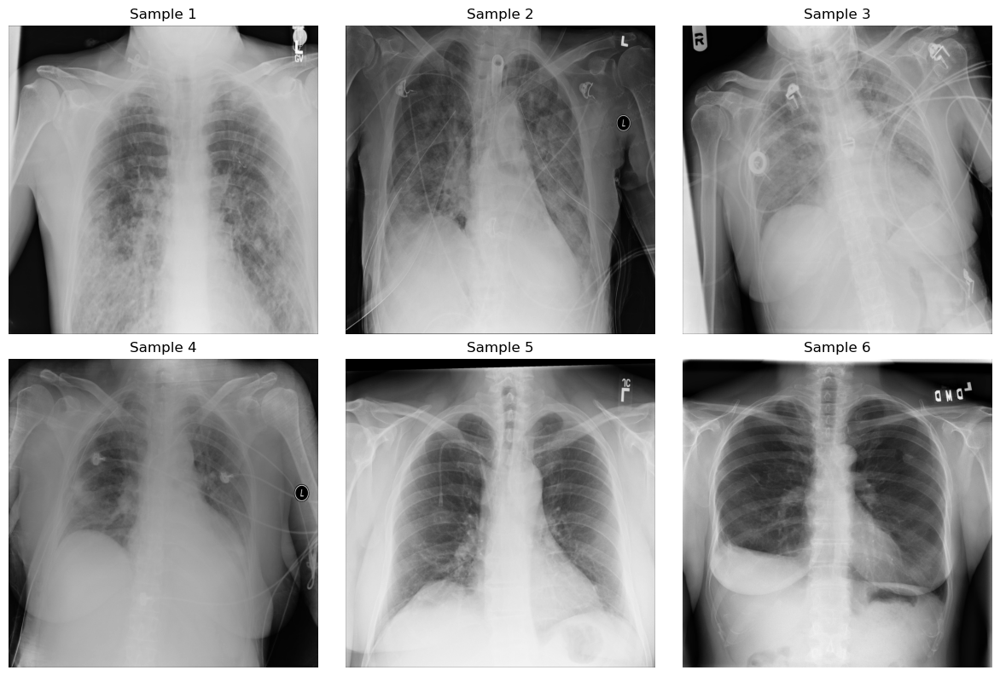

In [29]:
import random

# Function to visualize random slices from training images
def visualize_training_slices(image_paths, num_samples=6):
    """
    Visualize random DICOM image slices.

    Parameters:
    - image_paths: List of paths to training images.
    - num_samples: Number of random samples to display.
    """
    sample_paths = random.sample(image_paths, min(num_samples, len(image_paths)))

    plt.figure(figsize=(12, 8))
    for i, path in enumerate(sample_paths, 1):
        image = dcmread(path).pixel_array
        plt.subplot(2, 3, i)
        plt.imshow(image, cmap='gray')
        plt.title(f"Sample {i}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Apply to a subset of training images
visualize_training_slices(
    [os.path.join(nested_train_images_dir, f"{pid}.dcm") for pid in train_patient_ids[:50]],
    num_samples=6
)


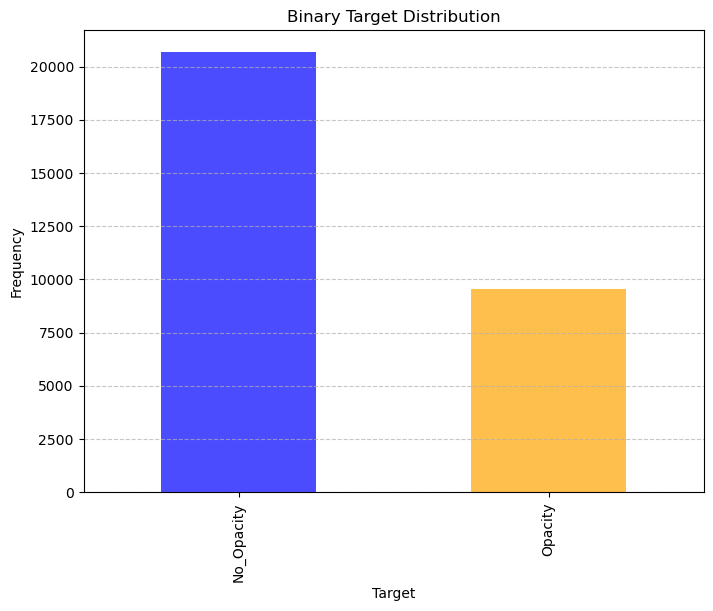

In [30]:
# Plot binary target distribution
plt.figure(figsize=(8, 6))
train_labels_df['Target'].value_counts().plot(kind='bar', color=['blue', 'orange'], alpha=0.7)
plt.title('Binary Target Distribution')
plt.xlabel('Target')
plt.ylabel('Frequency')
plt.xticks([0, 1], binary_class_labels)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


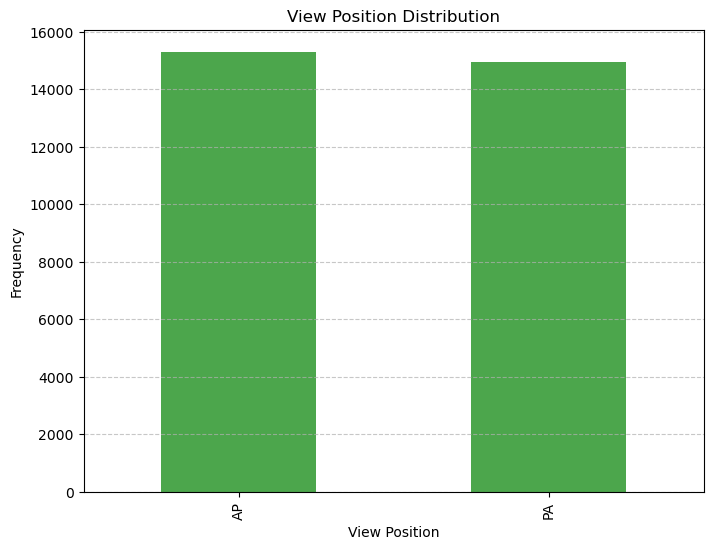

In [31]:
# View Position Distribution
plt.figure(figsize=(8, 6))
train_labels_df['ViewPosition'].value_counts().plot(kind='bar', color='green', alpha=0.7)
plt.title('View Position Distribution')
plt.xlabel('View Position')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


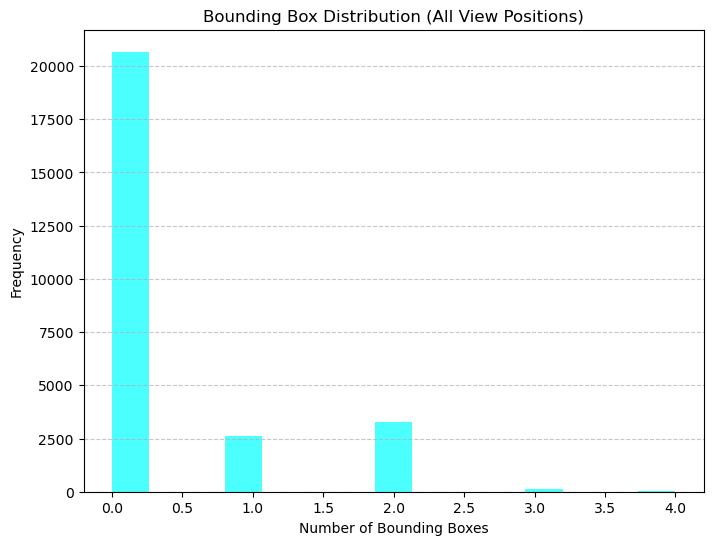

In [32]:
# Bounding box distribution across all ViewPositions
plt.figure(figsize=(8, 6))
plt.hist(metadata_df['numBoundingBoxes'], bins=15, color='cyan', alpha=0.7)
plt.title('Bounding Box Distribution (All View Positions)')
plt.xlabel('Number of Bounding Boxes')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


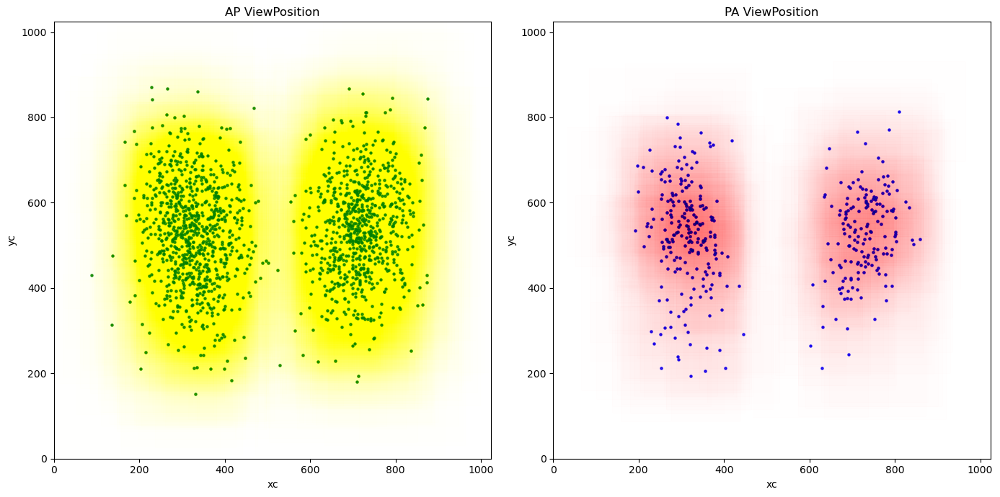

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Sample 2000 points from the training dataset where Target == 1
train_sample = train_labels_df[train_labels_df['Target'] == 1].sample(2000, random_state=42)

# Calculate the center of the bounding boxes
train_sample['xc'] = train_sample['x'] + train_sample['width'] / 2
train_sample['yc'] = train_sample['y'] + train_sample['height'] / 2

# Split the samples by ViewPosition
train_sample_AP = train_sample[train_sample['ViewPosition'] == 'AP']
train_sample_PA = train_sample[train_sample['ViewPosition'] == 'PA']

# Create a new figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 7))

# Plot the samples with ViewPosition == 'AP'
axs[0].set_title("AP ViewPosition")
train_sample_AP.plot.scatter(x='xc', y='yc', xlim=(0, 1024), ylim=(0, 1024), ax=axs[0], alpha=0.8, marker=".", color="green")
for _, crt_sample in train_sample_AP.iterrows():
    axs[0].add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                               width=crt_sample['width'],
                               height=crt_sample['height'],
                               alpha=3.5e-3, color="yellow"))

# Plot the samples with ViewPosition == 'PA'
axs[1].set_title("PA ViewPosition")
train_sample_PA.plot.scatter(x='xc', y='yc', xlim=(0, 1024), ylim=(0, 1024), ax=axs[1], alpha=0.8, marker=".", color="blue")
for _, crt_sample in train_sample_PA.iterrows():
    axs[1].add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                               width=crt_sample['width'],
                               height=crt_sample['height'],
                               alpha=3.5e-3, color="red"))

# Display the plot
plt.tight_layout()
plt.show()


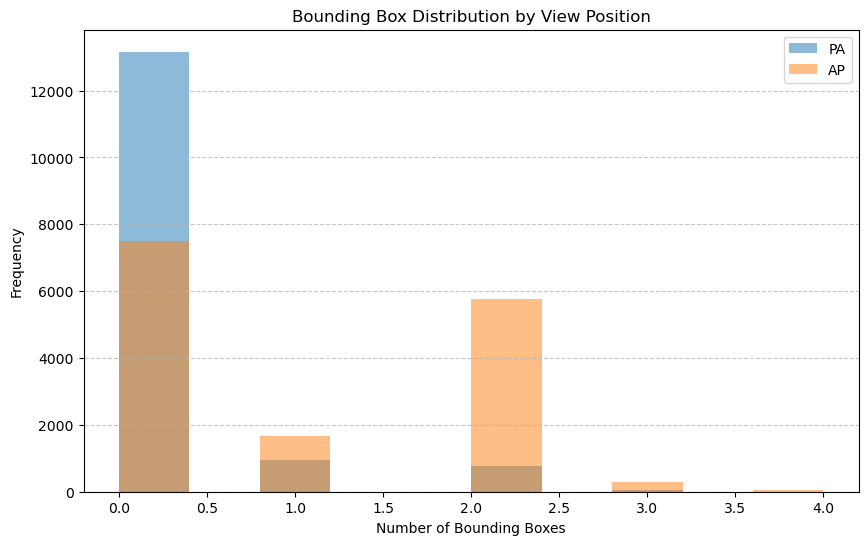

In [34]:
# Bounding box counts calculations
train_labels_df['NumBoundingBoxes'] = train_labels_df['patientId'].map(
    lambda pid: len(train_annotations_dict.get(pid, []))
)

# Distribution of bounding boxes by ViewPosition
plt.figure(figsize=(10, 6))
for view in train_labels_df['ViewPosition'].unique():
    subset = train_labels_df[train_labels_df['ViewPosition'] == view]
    plt.hist(subset['NumBoundingBoxes'], bins=10, alpha=0.5, label=view)

plt.title('Bounding Box Distribution by View Position')
plt.xlabel('Number of Bounding Boxes')
plt.ylabel('Frequency')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


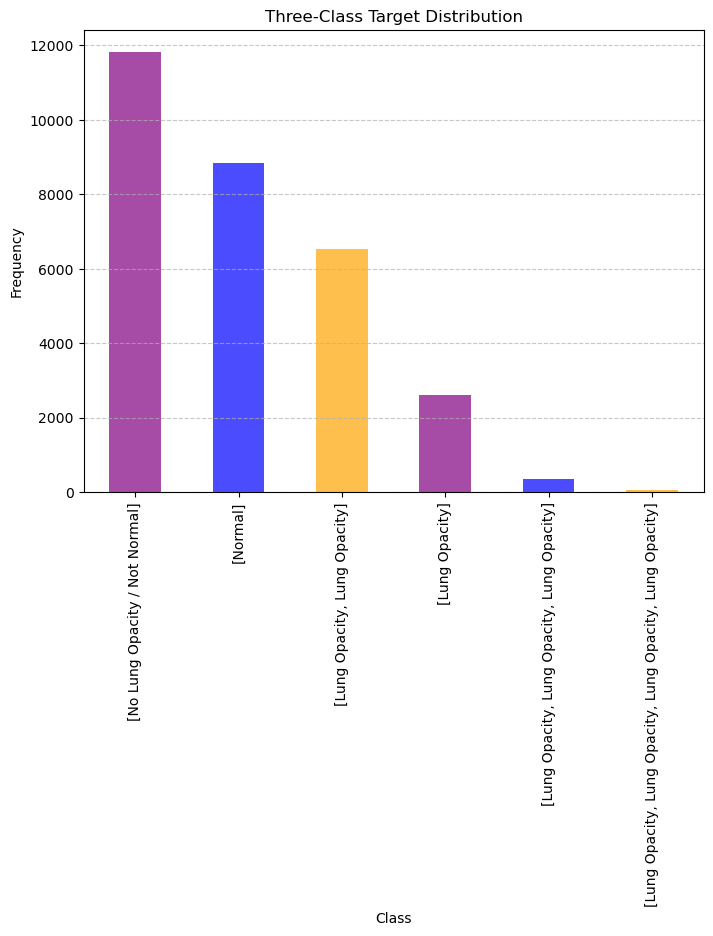

In [35]:
# Map class information to create a new column 'ClassLabel'
train_labels_df['ClassLabel'] = train_labels_df['patientId'].map(
    lambda pid: train_class_info_dict.get(pid, 'Unknown')
)

# Plot 3-class distribution
plt.figure(figsize=(8, 6))
train_labels_df['ClassLabel'].value_counts().plot(
    kind='bar', color=['purple', 'blue', 'orange'], alpha=0.7
)
plt.title('Three-Class Target Distribution')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [36]:
# Calculate and display the value counts for the 'ViewPosition' column
view_position_counts = train_labels_df['ViewPosition'].value_counts()

# Display the counts
view_position_counts


ViewPosition
AP    15297
PA    14930
Name: count, dtype: int64

In [37]:
# Unique Target classes and their distributions
unique_targets = train_labels_df['Target'].value_counts()

# Display the unique classes and their counts
print(unique_targets)



Target
0    20672
1     9555
Name: count, dtype: int64


### Observations

- For binary classification, the class imbalance is significant.
- For three-class classification, the class imbalance is within tolerable limits.
- The detected lung


In [38]:
# Isolate columns where entries are lists for studying the columns of the Metadata dataframe
remove_columns = ['classLabel', 'boundingBoxes', 'classInfo']

# Use the analyze_dataset function to reset and analyze the dataset
metadata_columns = [col for col in metadata_df.columns if col not in remove_columns]

# Create a subset of the metadata dataframe with the filtered columns
filtered_metadata_df = metadata_df[metadata_columns]

# Analyze the filtered metadata dataframe
missing_values_details = analyze_dataset(filtered_metadata_df)

print(missing_values_details)





Dataset Shape and Structure:
Shape: 29684 rows, 21 columns

First and Last 5 Rows of the Dataset:


,patientId,patientSex,patientAge,imageWidth,imageHeight,numBoundingBoxes,classInfoText,binaryLabel,ternaryLabel,datasetType,...,modality,examinedBodyPart,viewPosition,conversionType,pixelSpacing,photometricInterpretation,samplesPerPixel,lossyImageCompression,lossyCompressionMethod,pixelRepresentation
0,9c71c1ec-b6e6-46b1-89e1-398f921d7485,M,25,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
1,817a8977-7598-427a-92f7-57833c22e5fa,M,60,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
2,08fa5211-04ae-4150-b006-9683187f67d3,M,57,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
3,ec55e4ab-ecdd-4265-a5fa-d84ee0af1e0d,F,62,1024,1024,2.0,Lung Opacity,1.0,2.0,train,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
4,6b10737e-ec37-4f37-8db3-a95434db6016,M,54,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0


,patientId,patientSex,patientAge,imageWidth,imageHeight,numBoundingBoxes,classInfoText,binaryLabel,ternaryLabel,datasetType,...,modality,examinedBodyPart,viewPosition,conversionType,pixelSpacing,photometricInterpretation,samplesPerPixel,lossyImageCompression,lossyCompressionMethod,pixelRepresentation
29679,c1e88810-9e4e-4f39-9306-8d314bfc1ff1,F,10,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,AP,WSD,0.139,MONOCHROME2,1,1,ISO_10918_1,0
29680,c1ec035b-377b-416c-a281-f868b7c9b6c3,M,74,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
29681,c1ef5b66-0fd7-49d1-ae6b-5af84929414b,M,58,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
29682,c1ef6724-f95f-40f1-b25b-de806d9bc39d,M,36,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
29683,c1f55e7e-4065-4dc0-993e-a7c1704c6036,M,57,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0



Dataset Metadata Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29684 entries, 0 to 29683
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   patientId                  29684 non-null  object 
 1   patientSex                 29684 non-null  object 
 2   patientAge                 29684 non-null  object 
 3   imageWidth                 29684 non-null  int64  
 4   imageHeight                29684 non-null  int64  
 5   numBoundingBoxes           26684 non-null  float64
 6   classInfoText              26684 non-null  object 
 7   binaryLabel                26684 non-null  float64
 8   ternaryLabel               26684 non-null  float64
 9   datasetType                29684 non-null  object 
 10  imageFolder                29684 non-null  object 
 11  modality                   29684 non-null  object 
 12  examinedBodyPart           29684 non-null  object 
 13  viewPosition   

In [39]:
# Print the dataset shape explicitly
print_shape(filtered_metadata_df)


Dataset Shape: 29684 rows, 21 columns


In [40]:
metadata_df['patientAge'] = metadata_df['patientAge'].astype('int64')

In [41]:
def analyze_column_details(data_frame):
    """
    Analyze each column in the DataFrame to determine its categorical or numerical nature.

    Parameters:
    - data_frame: The DataFrame to analyze

    Returns:
    - DataFrame: A summary DataFrame containing details about valid categorical and numerical columns
    """
    import numpy as np

    column_summary = pd.DataFrame(columns=['ColumnName', 'UniqueClassCount', 'DataType', 'UniqueValues', 'UniqueValueCounts'])

    for idx, column in enumerate(data_frame.columns):
        # Skip columns with unhashable types (e.g., lists, sets, dicts)
        if data_frame[column].apply(lambda x: isinstance(x, (list, set, dict))).any():
            continue  # Skip this column

        # Process hashable columns
        unique_values = data_frame[column].dropna().unique()
        unique_value_count = len(unique_values)
        data_type = data_frame[column].dtype

        column_summary.loc[idx] = [
            column,
            unique_value_count,
            data_type,
            unique_values,
            data_frame[column].value_counts().values
        ]

    # Reset index for the resulting DataFrame
    return column_summary.reset_index(drop=True)


In [42]:
# Analyze column details, excluding unhashable columns
valid_column_summary = analyze_column_details(metadata_df)

# Display the valid categorical and numerical columns
display(valid_column_summary)



,ColumnName,UniqueClassCount,DataType,UniqueValues,UniqueValueCounts
0,patientId,29684,object,"[9c71c1ec-b6e6-46b1-89e1-398f921d7485, 817a897...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
1,patientSex,2,object,"[M, F]","[16880, 12804]"
2,patientAge,98,int64,"[25, 60, 57, 62, 54, 72, 33, 13, 51, 22, 49, 5...","[883, 829, 770, 758, 724, 721, 695, 690, 657, ..."
3,imageWidth,1,int64,[1024],[29684]
4,imageHeight,1,int64,[1024],[29684]
5,numBoundingBoxes,5,float64,"[0.0, 2.0, 1.0, 3.0, 4.0]","[20672, 3266, 2614, 119, 13]"
6,classInfoText,3,object,"[No Lung Opacity / Not Normal, Lung Opacity, N...","[11821, 8851, 6012]"
7,binaryLabel,2,float64,"[0.0, 1.0]","[20672, 6012]"
8,ternaryLabel,3,float64,"[1.0, 2.0, 0.0]","[11821, 8851, 6012]"
9,datasetType,3,object,"[train, val, test]","[21347, 5337, 3000]"


In [43]:
describe_dataset(metadata_df).T


,count,mean,std,min,25%,50%,75%,max,CoefficientOfVariation,Skewness,InterQuartileRange,LowerFence,UpperFence,OutlierPercentage
patientAge,29684.0,47.032206,16.951208,1.0,34.0,49.0,59.0,412.0,0.360417,-0.348257,25.0,-3.5,96.5,4.11
imageWidth,29684.0,1024.000000,0.000000,1024.0,1024.0,1024.0,1024.0,1024.0,0.000000,NaN,0.0,1024.0,1024.0,NaN
imageHeight,29684.0,1024.000000,0.000000,1024.0,1024.0,1024.0,1024.0,1024.0,0.000000,NaN,0.0,1024.0,1024.0,NaN
numBoundingBoxes,26684.0,0.358080,0.712231,0.0,0.0,0.0,0.0,4.0,1.989028,1.508275,0.0,0.0,0.0,inf
binaryLabel,26684.0,0.225304,0.417790,0.0,0.0,0.0,0.0,1.0,1.854342,1.617824,0.0,0.0,0.0,inf
ternaryLabel,26684.0,0.893607,0.738716,0.0,0.0,1.0,1.0,2.0,0.826668,-0.432074,1.0,-1.5,2.5,0.50
samplesPerPixel,29684.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0,0.000000,NaN,0.0,1.0,1.0,NaN
lossyImageCompression,29684.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0,0.000000,NaN,0.0,1.0,1.0,NaN
pixelRepresentation,29684.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,NaN


### Observations

- All images are having similar dimensions.
- The number of bounding boxes ranges from none to four.
- Some age data is incorrect, with the maximum age recorded as 412.
- Metadata has been successfully created as discussed above.
- All images share a single value for attributes such as Body Part Examined, ConversionType, SamplesPerPixel, LossyImageCompression, PixelRepresentation and LossyImageCompressionMethod.
- The `ViewPosition` attribute has two values: AP (Anterior/Posterior) and PA (Posterior/Anterior). 
- `PixelSpacing` contains seven unique values. These do not need to be explicitly accounted for when converting and resizing DICOM images, as CNNs are generally scale-invariant.



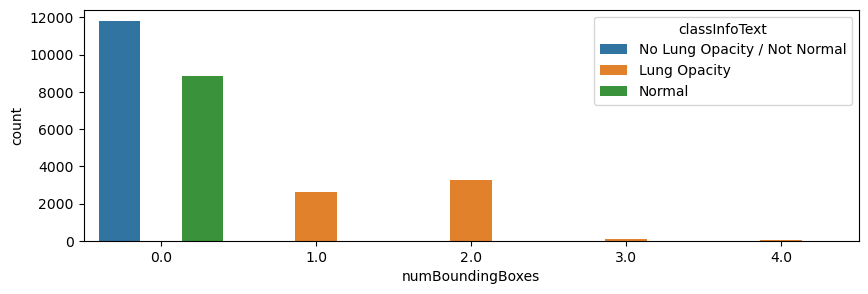

In [44]:
# Plot to see in which case and how many bounding boxes can be there per image

train_metadata_df = metadata_df[metadata_df['datasetType'] != 'test']

def plot_box_count(attribute):
    plt.figure(figsize=(10, 3))
    sns.countplot(x='numBoundingBoxes', data=train_metadata_df, hue=attribute)
    plt.show()

plot_box_count('classInfoText')


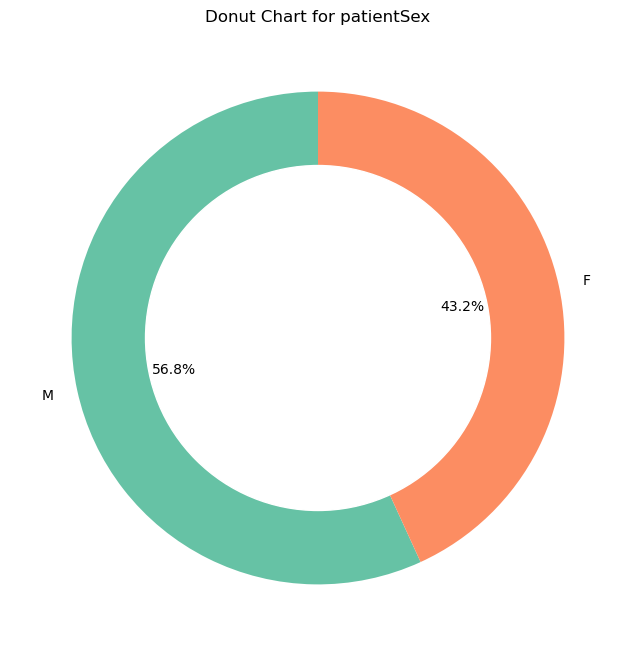

In [45]:
def donut_chart(attribute):
    category_counts = train_metadata_df[attribute].value_counts()
    plt.figure(figsize=(8, 8))
    plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=90, colors=['#66c2a5', '#fc8d62'])
    plt.gca().add_artist(plt.Circle((0, 0), 0.7, color='white'))
    plt.title(f'Donut Chart for {attribute}')
    plt.show()

donut_chart('patientSex')


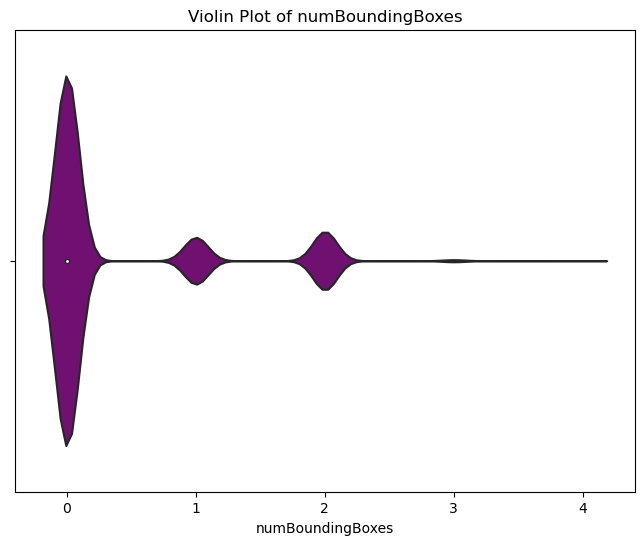

In [46]:
def violin_plot(column):
    plt.figure(figsize=(8, 6))
    sns.violinplot(x=column, data=train_metadata_df, color='purple')
    plt.title(f'Violin Plot of {column}')
    plt.show()

violin_plot('numBoundingBoxes')




## Observations
1. Bounding boxes are specified only in the case of Lung opacity
2. Males are more likely to have their chest x-ray taken than females

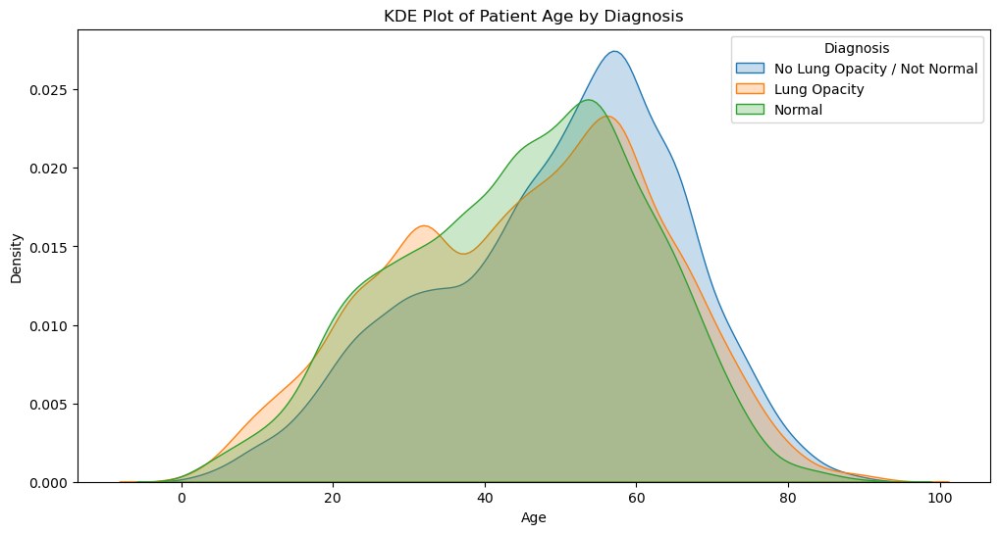

In [47]:
filtered_metadata = metadata_df[metadata_df['patientAge'] < 100]
unique_classes = filtered_metadata['classInfoText'].unique()

def kdeplot_age_distribution():
    fig, ax = plt.subplots(figsize=(12, 6))
    for cls in unique_classes:
        subset = filtered_metadata[filtered_metadata['classInfoText'] == cls]
        sns.kdeplot(subset['patientAge'], label=cls, ax=ax, shade=True)
    ax.set_xlabel('Age')
    ax.set_ylabel('Density')
    ax.set_title('KDE Plot of Patient Age by Diagnosis')
    ax.legend(title='Diagnosis')
    plt.show()

kdeplot_age_distribution()


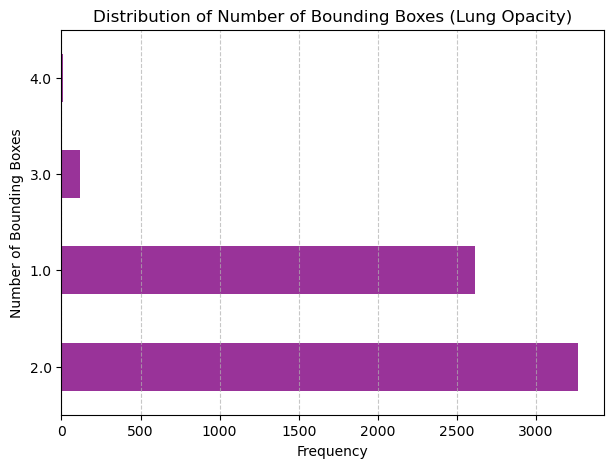

In [48]:
#Number of bounding box images distribution
def horizontal_bar_bounding_boxes():
    lung_opacity_data = train_metadata_df[train_metadata_df['classInfoText'] == 'Lung Opacity']
    counts = lung_opacity_data['numBoundingBoxes'].value_counts()

    plt.figure(figsize=(7, 5))
    counts.plot(kind='barh', color='purple', alpha=0.8)
    plt.title('Distribution of Number of Bounding Boxes (Lung Opacity)')
    plt.xlabel('Frequency')
    plt.ylabel('Number of Bounding Boxes')
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.show()

horizontal_bar_bounding_boxes()


### Observations

- Up to 4 bounding boxes can be present when the diagnosis is 'Lung Opacity'.
- No bounding boxes are specified for other cases.
- Approximately 22.5% of images are associated with 'Lung Opacity'.
- The class imbalance is manageable relative to other classes.
- Male cases slightly outnumber female cases.
- Some age values are incorrect. However, since this information is not used for training, it can be ignored safely


####  Step 5: Display DICOM images with bounding box. [ 5 points ]

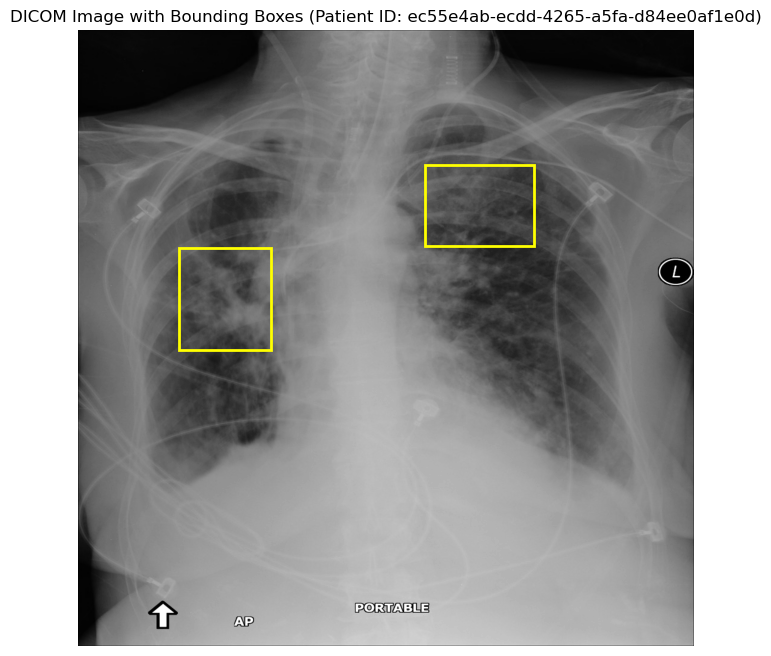

In [49]:
import matplotlib.patches as patches
def display_dicom_with_bboxes(patient_id, metadata_df, dicom_dir):
    """
    Display a DICOM image with bounding boxes for a given patient ID.

    Parameters:
    - patient_id: The patient ID whose image and bounding boxes to display.
    - metadata_df: The metadata DataFrame containing bounding box information.
    - dicom_dir: The directory containing DICOM files.

    Returns:
    - None
    """
    # Filter metadata for the given patient ID
    patient_data = metadata_df[metadata_df['patientId'] == patient_id].iloc[0]

    # Read the DICOM file
    dicom_path = os.path.join(dicom_dir, f"{patient_id}.dcm")
    dicom_data = dcmread(dicom_path)

    # Extract image pixel array
    image_array = dicom_data.pixel_array

    # Plot the DICOM image
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(image_array, cmap='gray')

    # Draw bounding boxes if available
    if patient_data['boundingBoxes']:
        for box in patient_data['boundingBoxes']:
            x, y, width, height = box
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='yellow', facecolor='none')
            ax.add_patch(rect)

    ax.set_title(f"DICOM Image with Bounding Boxes (Patient ID: {patient_id})")
    ax.axis('off')
    plt.show()

# `train_metadata_df` and `nested_train_images_dir` with the actual DataFrame and directory paths
sample_patient_id = train_metadata_df.loc[train_metadata_df['classInfoText'] == 'Lung Opacity', 'patientId'].iloc[0]
display_dicom_with_bboxes(sample_patient_id, train_metadata_df, nested_train_images_dir)


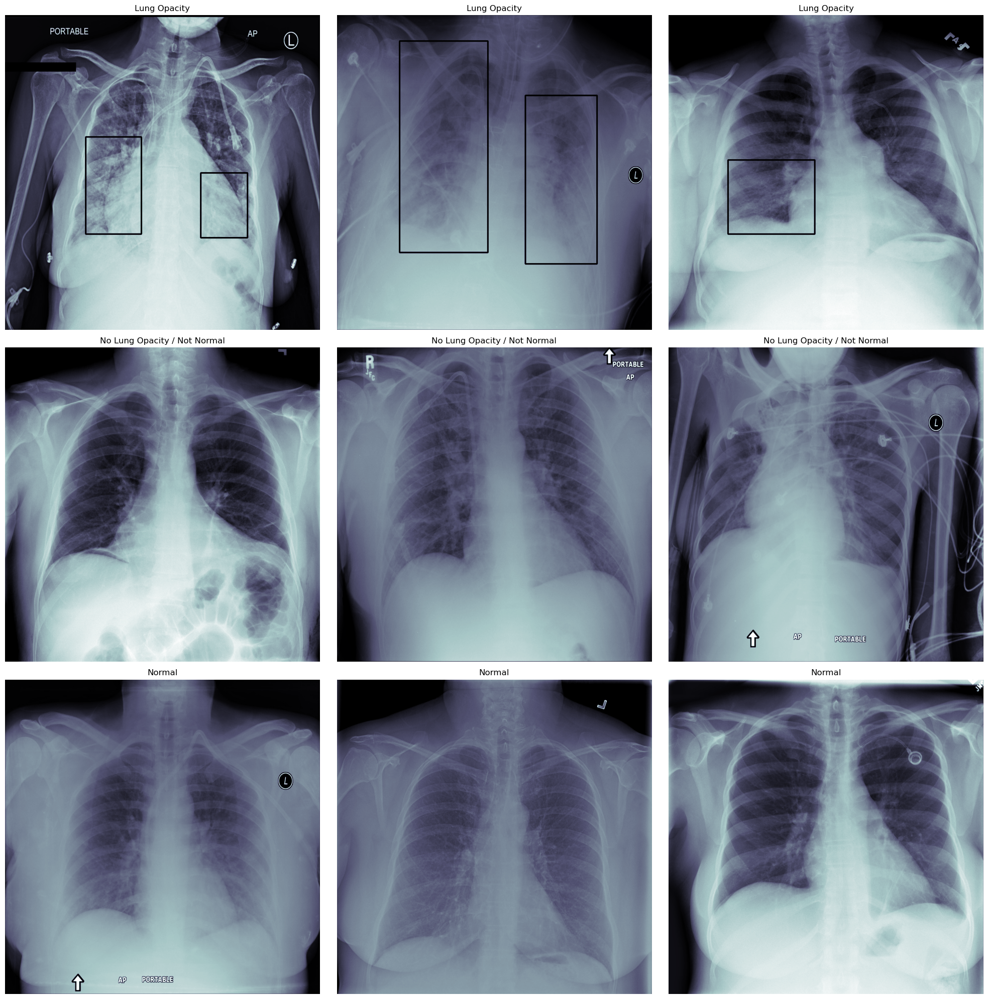

In [50]:
import cv2

def add_bounding_boxes(image_array, bounding_box, resize_factor):
    """
    Add bounding boxes to the image.

    Parameters:
    - image_array: The input image array.
    - bounding_box: The bounding box coordinates [x, y, width, height].
    - resize_factor: Scaling factor for resizing coordinates.

    Returns:
    - image_array: The image with bounding boxes added.
    """
    x = int(bounding_box[0] * resize_factor)
    y = int(bounding_box[1] * resize_factor)
    w = int(bounding_box[2] * resize_factor)
    h = int(bounding_box[3] * resize_factor)

    cv2.rectangle(image_array, (x, y), (x + w, y + h), color=0, thickness=int(3 * resize_factor + 0.5))
    return image_array

# Get random sample patients for each diagnosis class
diagnosis_sample_patients = train_metadata_df.groupby('classInfoText')['patientId'] \
                                .apply(lambda x: list(np.random.choice(x, 3, replace=False))) \
                                .to_dict()

# Define resize factor for DICOM images
resize_factor = original_image_size / 1024

# Initialize subplots in a grid 3x3
figure, axes = plt.subplots(3, 3, figsize=(20, 20))

for row_index, diagnosis_class in enumerate(['Lung Opacity', 'No Lung Opacity / Not Normal', 'Normal']):
    for col_index in range(3):
        patient_id = diagnosis_sample_patients[diagnosis_class][col_index]
        dicom_file_path = f'{nested_train_images_dir}/{patient_id}.dcm'

        # Convert DICOM to image
        dicom_image_data = dcmread(dicom_file_path)
        image_data = dicom_image_data.pixel_array

        # Add bounding boxes if the diagnosis class is 'Lung Opacity'
        if diagnosis_class == 'Lung Opacity':
            bounding_boxes = train_annotations_dict.get(patient_id)
            if bounding_boxes is not None:
                for bounding_box in bounding_boxes:
                    image_data = add_bounding_boxes(image_data, bounding_box, resize_factor)

        axes[row_index, col_index].imshow(image_data, cmap=plt.cm.bone)
        axes[row_index, col_index].axis('off')
        axes[row_index, col_index].set_title(diagnosis_class)

plt.tight_layout()
plt.show()


####  Step 5: Display PNG images with bounding box.

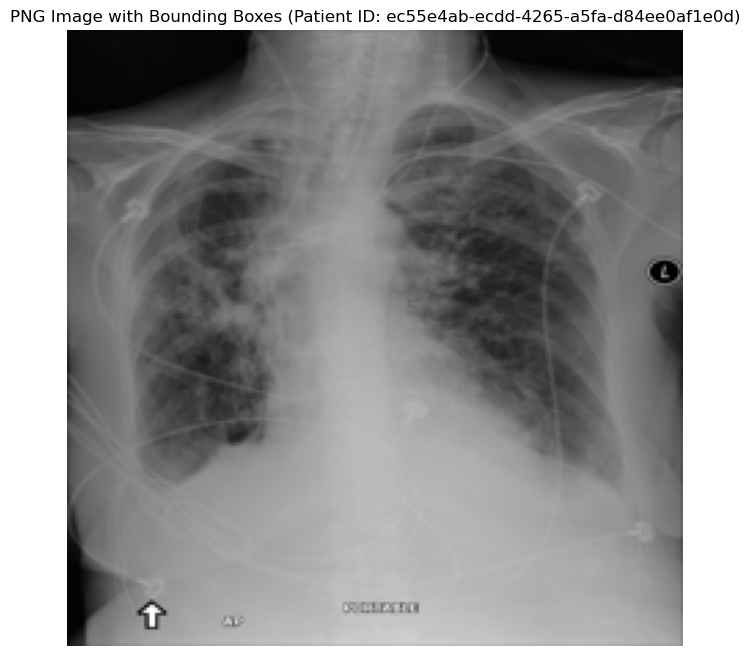

In [51]:
from matplotlib.patches import Rectangle
from PIL import Image
import os

def display_png_with_bounding_boxes(patient_id, metadata_df, png_base_dir, num_classes):
    """
    Display a PNG image with bounding boxes for a given patient ID.

    Parameters:
    - patient_id: The patient ID whose image and bounding boxes to display.
    - metadata_df: The metadata DataFrame containing bounding box information.
    - png_base_dir: Base directory containing PNG files.
    - num_classes: Number of classification classes (binary or ternary).

    Returns:
    - None
    """
    # Filter metadata for the given patient ID
    patient_data = metadata_df[metadata_df['patientId'] == patient_id].iloc[0]

    # Determine the subdirectory based on the classification type and label
    if num_classes == 2:
        class_label = binary_class_labels[int(patient_data['binaryLabel'])]
    else:
        class_label = ternary_class_labels[int(patient_data['ternaryLabel'])]

    # Construct the PNG file path
    png_path = os.path.join(png_base_dir, class_label, f"{patient_id}.png")
    if not os.path.exists(png_path):
        print(f"PNG file not found: {png_path}")
        return

    # Load the PNG image
    png_image = Image.open(png_path)

    # Plot the PNG image
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(png_image, cmap='gray')

    # Draw bounding boxes if available
    if patient_data['boundingBoxes']:
        for box in patient_data['boundingBoxes']:
            x, y, width, height = box
            rect = Rectangle((x, y), width, height, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

    ax.set_title(f"PNG Image with Bounding Boxes (Patient ID: {patient_id})")
    ax.axis('off')
    plt.show()

# Example Usage
sample_patient_id = train_metadata_df.loc[train_metadata_df['classInfoText'] == 'Lung Opacity', 'patientId'].iloc[0]
display_png_with_bounding_boxes(sample_patient_id, train_metadata_df, training_png_directory, num_classes=2)


In [52]:
def fetch_image(patient_identifier, metadata_table):
    """
    Fetch the PNG image for the specified patient identifier using metadata details.

    Parameters:
    - patient_identifier: The unique identifier of the patient.
    - metadata_table: The metadata DataFrame containing image paths and patient information.

    Returns:
    - numpy.ndarray: The retrieved image as a NumPy array.
    """
    # Retrieve the file path or directory for the specified patient identifier
    directory_or_path = metadata_table.loc[metadata_table['patientId'] == patient_identifier, 'imageFolder'].values[0]

    # Check if the path includes a file extension (e.g., '.png')
    if directory_or_path.endswith('.png'):
        image_path = directory_or_path
    else:
        # Construct the file path by appending the file name
        image_path = os.path.join(directory_or_path, patient_identifier + '.png')

    # Load the image using PIL and convert it to a NumPy array
    from PIL import Image
    img = Image.open(image_path)
    img = np.array(img)
    return img

def overlay_bounding_boxes(image, bounding_box, scale_ratio):
    """
    Overlay bounding boxes on the provided image.

    Parameters:
    - image: The input image array.
    - bounding_box: Coordinates for the bounding box [x, y, width, height].
    - scale_ratio: Scaling factor for resizing coordinates.

    Returns:
    - image: The image with bounding boxes overlaid.
    """
    x_coord = int(bounding_box[0] * scale_ratio)
    y_coord = int(bounding_box[1] * scale_ratio)
    box_width = int(bounding_box[2] * scale_ratio)
    box_height = int(bounding_box[3] * scale_ratio)

    # Draw a rectangle on the image
    cv2.rectangle(image, (x_coord, y_coord), (x_coord + box_width, y_coord + box_height), color=(255, 0, 0), thickness=int(3 * scale_ratio + 0.5))
    return image


Processing Patient Identifier: f5ff6567-9b99-4070-9b62-51b336336859, Diagnosis: Lung Opacity
Processing Patient Identifier: 9e0e8620-d08b-4704-9782-19b061a5d83b, Diagnosis: Lung Opacity
Processing Patient Identifier: b21e0de5-4fee-4584-9ee1-31af96400c21, Diagnosis: Lung Opacity
Processing Patient Identifier: c292bdb0-2fab-4498-86b0-0cf4e15f1e03, Diagnosis: No Lung Opacity / Not Normal
Processing Patient Identifier: 8966aa93-d9f3-4314-a54f-a7353ea12c6e, Diagnosis: No Lung Opacity / Not Normal
Processing Patient Identifier: cb6771a6-e0cc-4a8e-a19c-3179608b9b12, Diagnosis: No Lung Opacity / Not Normal
Processing Patient Identifier: 73114e87-0b3b-48bd-9c9d-94c92c488997, Diagnosis: Normal
Processing Patient Identifier: 8c55b222-9d23-4dfe-bddd-a4649cb70c63, Diagnosis: Normal
Processing Patient Identifier: 50b72f46-6536-44c4-a040-7bff3df602f5, Diagnosis: Normal


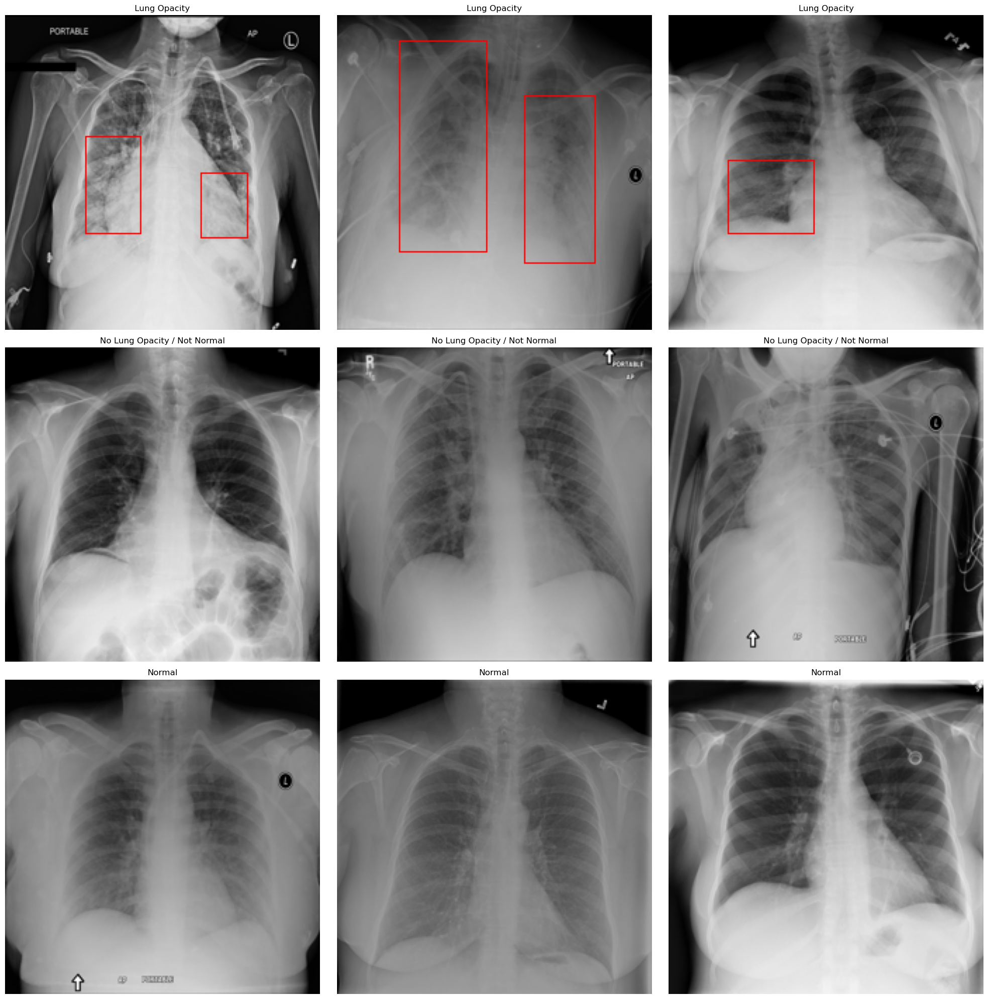

In [53]:

# Define scale ratio for PNG Images
scaling_factor = input_image_size / original_image_size

# Initialize a grid of subplots (3x3)
figure, axes_grid = plt.subplots(3, 3, figsize=(20, 20))

for row_idx, diagnosis_category in enumerate(['Lung Opacity', 'No Lung Opacity / Not Normal', 'Normal']):
    for col_idx in range(3):
        patient_identifier = diagnosis_sample_patients[diagnosis_category][col_idx]
        print(f"Processing Patient Identifier: {patient_identifier}, Diagnosis: {diagnosis_category}")

        try:
            # Fetch the image
            image_data = fetch_image(patient_identifier, train_metadata_df)

            # Add bounding boxes for 'Lung Opacity' category
            if diagnosis_category == 'Lung Opacity':
                bounding_boxes = train_annotations_dict.get(patient_identifier)
                if bounding_boxes is not None:
                    for bounding_box in bounding_boxes:
                        image_data = overlay_bounding_boxes(image_data, bounding_box, scaling_factor)

            # Display the image
            axes_grid[row_idx, col_idx].imshow(image_data, cmap='gray')
            axes_grid[row_idx, col_idx].axis('off')
            axes_grid[row_idx, col_idx].set_title(diagnosis_category)
        except Exception as error:
            print(f"Error processing Patient Identifier {patient_identifier}: {error}")
            axes_grid[row_idx, col_idx].axis('off')
            axes_grid[row_idx, col_idx].set_title(f"Missing: {diagnosis_category}")

plt.tight_layout()
plt.show()


### ***Observations***

Upon visually comparing the DICOM images with the corresponding PNG images, they appear identical. All features have been preserved effectively, even after rescaling and format conversion.

### **Step 6:** Designing, Training, and Testing Basic CNN Models for Classification

In [54]:
from tensorflow.keras import models, layers
def build_binary_cnn(input_shape=(224, 224, 3)):
    """
    Build a simple CNN model for binary classification.

    Parameters:
    - input_shape: Shape of the input images.

    Returns:
    - model: Compiled CNN model.
    """
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # Single output for binary classification
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model


In [55]:
# Import the necessary library for image augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an instance of the ImageDataGenerator with data augmentation and validation split
train_datagen = ImageDataGenerator(
    rescale=1./255,               # Normalize pixel values
    rotation_range=20,            # Randomly rotate images in the range 0-20 degrees
    width_shift_range=0.2,        # Randomly shift images horizontally by up to 20%
    height_shift_range=0.2,       # Randomly shift images vertically by up to 20%
    shear_range=0.2,              # Shear transformation
    zoom_range=0.2,               # Randomly zoom into images
    horizontal_flip=True,         # Randomly flip images horizontally
    validation_split=0.2          # Reserve 20% of data for validation
)

# Training data generator
train_generator = train_datagen.flow_from_directory(
    training_png_directory,       # Path to the training directory
    target_size=(224, 224),       # Resize all images to 224x224
    batch_size=32,                # Number of images per batch
    class_mode='binary',          # Binary classification
    subset='training'             # Use the training subset
)

# Validation data generator
val_generator = train_datagen.flow_from_directory(
    training_png_directory,       # Path to the training directory
    target_size=(224, 224),       # Resize all images to 224x224
    batch_size=32,                # Number of images per batch
    class_mode='binary',          # Binary classification
    subset='validation'           # Use the validation subset
)

# Display the class indices
print("Class indices:", train_generator.class_indices)


Found 17078 images belonging to 2 classes.
Found 4269 images belonging to 2 classes.
Class indices: {'No_Opacity': 0, 'Opacity': 1}


In [56]:
# Build the model
binary_cnn_model = build_binary_cnn(input_shape=(224, 224, 3))

# Train the model
history = binary_cnn_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10
)


Epoch 1/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 983s 2s/step - accuracy: 0.7641 - loss: 0.5530 - val_accuracy: 0.7747 - val_loss: 0.4915
Epoch 2/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 952s 2s/step - accuracy: 0.7737 - loss: 0.4921 - val_accuracy: 0.7756 - val_loss: 0.4737
Epoch 3/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 957s 2s/step - accuracy: 0.7803 - loss: 0.4728 - val_accuracy: 0.7936 - val_loss: 0.4652
Epoch 4/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 947s 2s/step - accuracy: 0.7853 - loss: 0.4652 - val_accuracy: 0.7913 - val_loss: 0.4567
Epoch 5/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 950s 2s/step - accuracy: 0.7873 - loss: 0.4618 - val_accuracy: 0.7857 - val_loss: 0.4620
Epoch 6/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 958s 2s/step - accuracy: 0.7900 - loss: 0.4548 - val_accuracy: 0.7978 - val_loss: 0.4466
Epoch 7/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 624s 1s/step - accuracy: 0.7869 - loss: 0.4608 - val_accuracy: 0.7990 - val_loss: 0.4365
Epoch 8/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 524s 981ms/step - accuracy: 0.7888 - loss: 0.4532 - val_a

In [57]:
print("Train Generator Target Shape:", train_generator[0][1].shape)
print("Validation Generator Target Shape:", val_generator[0][1].shape)


Train Generator Target Shape: (32,)
Validation Generator Target Shape: (32,)


In [58]:
print("Model Output Shape:", binary_cnn_model.output_shape)


Model Output Shape: (None, 1)


In [59]:
test_loss, test_accuracy = binary_cnn_model.evaluate(val_generator)
print(f"Validation Accuracy: {test_accuracy:.2f}")


134/134 ━━━━━━━━━━━━━━━━━━━━ 79s 587ms/step - accuracy: 0.8003 - loss: 0.4385
Validation Accuracy: 0.80


## **Milestone 2:**

### ***Step 1:*** Fine tune the trained basic CNN models for classification. [ 5 points ]

**1. Load and Verify Dataset**

In [60]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
from tensorflow.keras import models, layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt


In [ ]:
# Preprocessed directories
training_png_directory = '/Users/aman/Desktop/train_images224RGB2'
validation_png_directory = '/Users/aman/Desktop/val_images224RGB2'
testing_png_directory = '/Users/aman/Desktop/test_images224RGB2'

# Labels for classification
binary_class_labels = ['No_Opacity', 'Opacity']
ternary_class_labels = ['Normal', 'No_Opacity_Not_Normal', 'Opacity']

# Verify directories
for directory in [training_png_directory, validation_png_directory, testing_png_directory]:
    if os.path.exists(directory):
        print(f"Directory verified: {directory}")
    else:
        raise FileNotFoundError(f"Directory not found: {directory}")


**2. Data Augmentation and Generators**

In [62]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # Split for validation
)

# Test generator
test_datagen = ImageDataGenerator(rescale=1./255)

# Training and validation generators
train_generator = train_datagen.flow_from_directory(
    directory=training_png_directory,
    target_size=(224, 224),
    batch_size=16,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    directory=training_png_directory,
    target_size=(224, 224),
    batch_size=16,
    class_mode='binary',
    subset='validation'
)

# Test generator
test_generator = test_datagen.flow_from_directory(
    directory=validation_png_directory,  # For testing
    target_size=(224, 224),
    batch_size=16,
    class_mode='binary',
    shuffle=False
)


Found 17078 images belonging to 2 classes.
Found 4269 images belonging to 2 classes.
Found 5337 images belonging to 2 classes.


**3. Fine-Tune the Model**

In [63]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix

# Load or rebuild model
model_path = 'basic_cnn_model.keras'

if os.path.exists(model_path):
    from tensorflow.keras.models import load_model
    fine_tuned_model = load_model(model_path)
    print(f"Loaded model from {model_path}")
else:
    fine_tuned_model = build_binary_cnn(input_shape=(224, 224, 3))
    fine_tuned_model.save(model_path)
    print(f"New model built and saved as {model_path}")

# Compile with adjusted learning rate
fine_tuned_model.compile(
    optimizer=Adam(learning_rate=1e-4),  
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Add callbacks
lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5, 
    patience=3,  
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    filepath='fine_tuned_cnn_model.keras',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

# Fine-tune the model
history = fine_tuned_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20,  # Increased epochs for fine-tuning
    callbacks=[lr_scheduler, model_checkpoint]
)

print("Fine-tuning completed. Model saved as 'fine_tuned_cnn_model.keras'.")


Loaded model from basic_cnn_model.keras
Epoch 1/20
1068/1068 ━━━━━━━━━━━━━━━━━━━━ 513s 476ms/step - accuracy: 0.7962 - loss: 0.4402 - val_accuracy: 0.8117 - val_loss: 0.4221 - learning_rate: 1.0000e-04
Epoch 2/20
1068/1068 ━━━━━━━━━━━━━━━━━━━━ 507s 474ms/step - accuracy: 0.7974 - loss: 0.4393 - val_accuracy: 0.8103 - val_loss: 0.4233 - learning_rate: 1.0000e-04
Epoch 3/20
1068/1068 ━━━━━━━━━━━━━━━━━━━━ 567s 479ms/step - accuracy: 0.8049 - loss: 0.4243 - val_accuracy: 0.8063 - val_loss: 0.4254 - learning_rate: 1.0000e-04
Epoch 4/20
1068/1068 ━━━━━━━━━━━━━━━━━━━━ 500s 468ms/step - accuracy: 0.8009 - loss: 0.4335 - val_accuracy: 0.8084 - val_loss: 0.4187 - learning_rate: 1.0000e-04
Epoch 5/20
1068/1068 ━━━━━━━━━━━━━━━━━━━━ 505s 473ms/step - accuracy: 0.8059 - loss: 0.4230 - val_accuracy: 0.8140 - val_loss: 0.4184 - learning_rate: 1.0000e-04
Epoch 6/20
1068/1068 ━━━━━━━━━━━━━━━━━━━━ 507s 474ms/step - accuracy: 0.8054 - loss: 0.4225 - val_accuracy: 0.8105 - val_loss: 0.4156 - learning_rate:

**4. Evaluate the Model**

In [70]:
# Evaluate on the test set
from tensorflow.keras.callbacks import ModelCheckpoint

test_generator.reset()
predictions = fine_tuned_model.predict(test_generator)
predicted_classes = (predictions > 0.5).astype(int).flatten()
true_classes = test_generator.classes

# Classification report and confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=binary_class_labels))

print("Confusion Matrix:")
conf_matrix = confusion_matrix(true_classes, predicted_classes)
print(conf_matrix)


334/334 ━━━━━━━━━━━━━━━━━━━━ 70s 209ms/step
Classification Report:
              precision    recall  f1-score   support

  No_Opacity       0.86      0.91      0.88      4135
     Opacity       0.60      0.49      0.54      1202

    accuracy                           0.81      5337
   macro avg       0.73      0.70      0.71      5337
weighted avg       0.80      0.81      0.80      5337

Confusion Matrix:
[[3750  385]
 [ 617  585]]


**5. Save and Visualize Predictions**

Predictions saved to 'test_predictions.csv'.


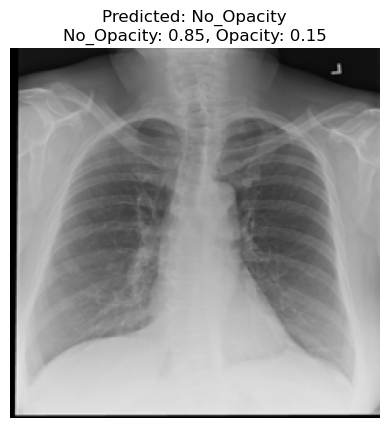

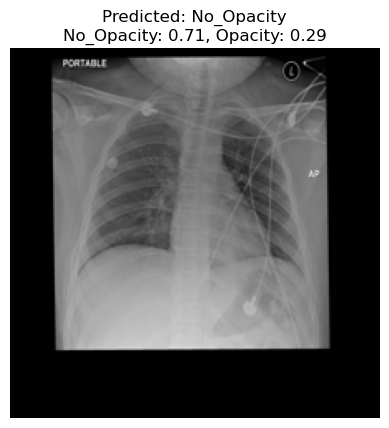

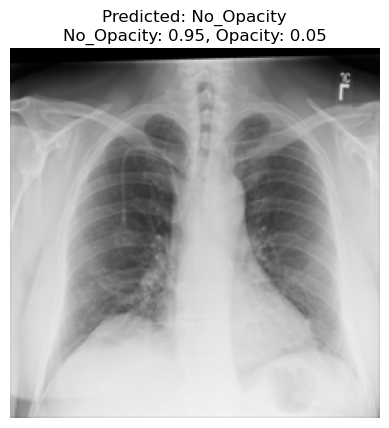

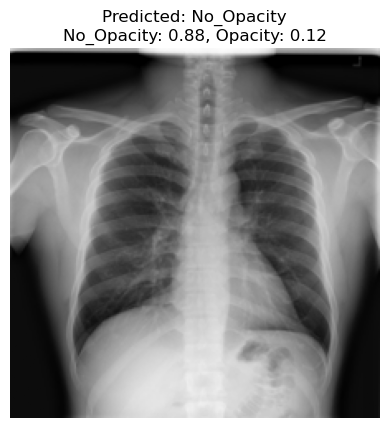

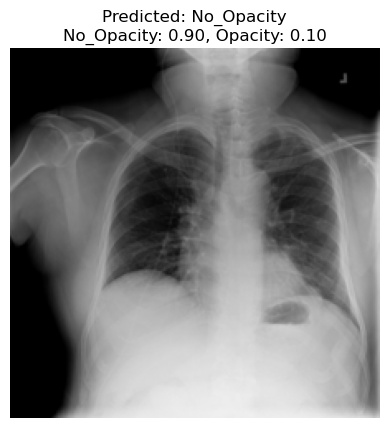

In [71]:
# Save predictions
import pandas as pd

# Extract filenames from the generator
test_files = [f.split('/')[-1] for f in test_generator.filenames]

# Adjust predictions for binary classification
test_df = pd.DataFrame({
    'Filename': test_files,
    'True_Class': [binary_class_labels[i] for i in true_classes],
    'Predicted_Class': [binary_class_labels[i] for i in predicted_classes],
    'No_Opacity_Probability': 1 - predictions.flatten(),  # Probability for No_Opacity
    'Opacity_Probability': predictions.flatten()  # Probability for Opacity
})

# Save to CSV
test_df.to_csv('test_predictions.csv', index=False)
print("Predictions saved to 'test_predictions.csv'.")

# Visualize a few predictions
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

for i in range(5):
    img_path = os.path.join(validation_png_directory, test_df['Filename'].iloc[i])
    img = mpimg.imread(img_path)
    predicted_label = test_df['Predicted_Class'].iloc[i]
    no_opacity_prob = test_df['No_Opacity_Probability'].iloc[i]
    opacity_prob = test_df['Opacity_Probability'].iloc[i]

    plt.imshow(img)
    plt.title(f"Predicted: {predicted_label}\nNo_Opacity: {no_opacity_prob:.2f}, Opacity: {opacity_prob:.2f}")
    plt.axis('off')
    plt.show()


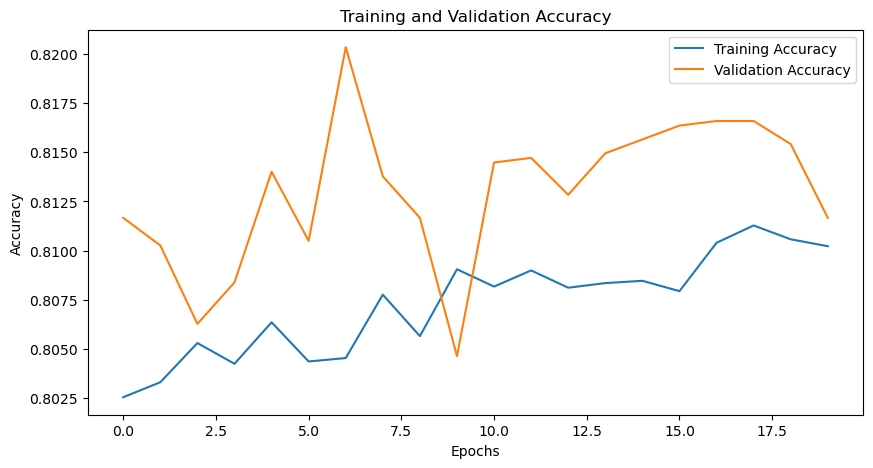

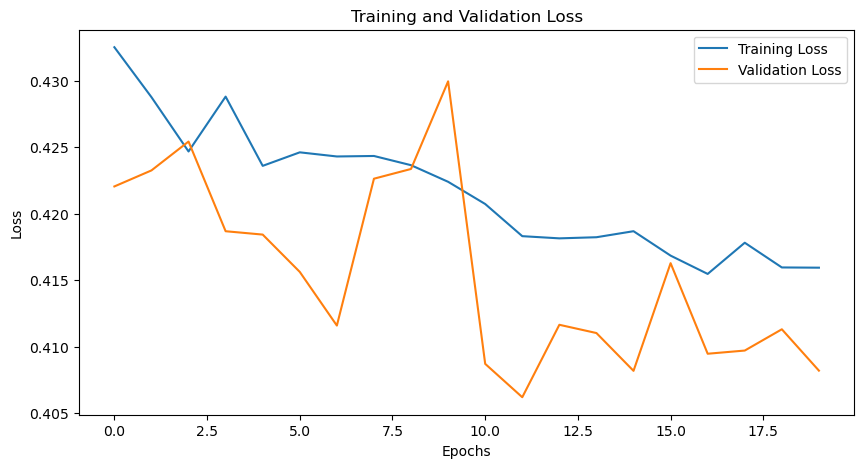

In [72]:
# Plot accuracy and loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


### Overview

### Fine-tuning involves:

Unfreezing some layers of the pre-trained model to allow further training.
Adjusting hyperparameters (learning rate, batch size).
Adding data augmentation to improve generalization.
Training with early stopping and model checkpointing.

### ***Step 2:*** Apply Transfer Learning

### ***Objective:*** Utilize a pre-trained model (e.g., VGG16, ResNet, or Inception) for better feature extraction and classification.

### **Steps for Transfer Learning:**
### **1. Load Pretrained Model**

In [73]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout

# Load pre-trained VGG16 without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers to retain pre-trained weights
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers for binary classification
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)  # Binary classification

# Define the new model
transfer_learning_model = Model(inputs=base_model.input, outputs=output)

# Compile the model
transfer_learning_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
transfer_learning_model.summary()


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,137,729 (80.63 MB)

 Trainable params: 6,423,041 (24.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

**2. Load Data Generators**

In [41]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define constants
input_image_size = 224  # Input image size for the transfer learning model
batch_size = 32         # Batch size for data generators

# Define image data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,            # Normalize pixel values
    rotation_range=30,         # Random rotation
    width_shift_range=0.2,     # Random horizontal shift
    height_shift_range=0.2,    # Random vertical shift
    shear_range=0.2,           # Random shearing
    zoom_range=0.2,            # Random zooming
    horizontal_flip=True,      # Random horizontal flip
    validation_split=0.2       # Reserve 20% of training data for validation
)

# Define generator for testing (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load training data generator
train_generator = train_datagen.flow_from_directory(
    directory='/Users/aman/Desktop/train_images224RGB2',
    target_size=(input_image_size, input_image_size),
    batch_size=batch_size,
    class_mode='binary',  # Binary classification (No_Opacity, Opacity)
    subset='training'
)

# Load validation data generator
val_generator = train_datagen.flow_from_directory(
    directory='/Users/aman/Desktop/train_images224RGB2',
    target_size=(input_image_size, input_image_size),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation'
)

# Load testing data generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    target_size=(input_image_size, input_image_size),
    batch_size=batch_size,
    class_mode=None,  
    shuffle=False      
)

# Verify the loaded generators
print("Training Generator Classes:", train_generator.class_indices)
print("Validation Generator Classes:", val_generator.class_indices)
print("Number of Training Samples:", train_generator.samples)
print("Number of Validation Samples:", val_generator.samples)
print("Number of Testing Samples:", len(test_generator.filenames))


Found 17078 images belonging to 2 classes.
Found 4269 images belonging to 2 classes.
Found 3000 validated image filenames.
Training Generator Classes: {'No_Opacity': 0, 'Opacity': 1}
Validation Generator Classes: {'No_Opacity': 0, 'Opacity': 1}
Number of Training Samples: 17078
Number of Validation Samples: 4269
Number of Testing Samples: 3000


**3. Train the Transfer Learning Model**

In [75]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Define callbacks
checkpoint = ModelCheckpoint('transfer_learning_model.keras', save_best_only=True, monitor='val_accuracy', mode='max')
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = transfer_learning_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,
    callbacks=[checkpoint, early_stopping]
)

print("Transfer learning model trained and saved as 'transfer_learning_model.keras'.")


Epoch 1/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 4318s 8s/step - accuracy: 0.7470 - loss: 0.8080 - val_accuracy: 0.7747 - val_loss: 0.4331
Epoch 2/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 3694s 7s/step - accuracy: 0.7757 - loss: 0.4667 - val_accuracy: 0.7747 - val_loss: 0.4246
Epoch 3/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 2437s 4s/step - accuracy: 0.7668 - loss: 0.4563 - val_accuracy: 0.7747 - val_loss: 0.4279
Epoch 4/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 2420s 5s/step - accuracy: 0.7749 - loss: 0.4535 - val_accuracy: 0.7747 - val_loss: 0.4241
Epoch 5/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 2417s 5s/step - accuracy: 0.7711 - loss: 0.4594 - val_accuracy: 0.7747 - val_loss: 0.4220
Epoch 6/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 2415s 5s/step - accuracy: 0.7730 - loss: 0.4488 - val_accuracy: 0.7747 - val_loss: 0.4200
Epoch 7/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 2430s 5s/step - accuracy: 0.7723 - loss: 0.4597 - val_accuracy: 0.7747 - val_loss: 0.4172
Epoch 8/10
534/534 ━━━━━━━━━━━━━━━━━━━━ 2418s 5s/step - accuracy: 0.7744 - loss: 0.4491 - 

**4. Evaluate the Model**

In [ ]:
import os
import pandas as pd
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# --- Paths ---
testing_png_directory = '/Users/aman/Desktop/test_images224RGB2'
model_path = '/Users/aman/Desktop/transfer_learning_model.keras'

# Verify the model file exists
if not os.path.exists(model_path):
    raise FileNotFoundError(f"Model file not found at: {model_path}")

# Load the saved transfer learning model
transfer_learning_model = load_model(model_path)
print(f"Loaded model from {model_path}")

# Verify test directory content
test_files = [f for f in os.listdir(testing_png_directory) if f.endswith('.png')]
if len(test_files) == 0:
    raise ValueError(f"No PNG files found in {testing_png_directory}. Please check the directory content.")

# Create a DataFrame for test files
test_df = pd.DataFrame({'filename': [os.path.join(testing_png_directory, f) for f in test_files]})

# Initialize test data generator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col=None,  
    target_size=(224, 224),
    batch_size=32,
    class_mode=None,  
    shuffle=False
)

# Ensure the generator yields batches in the correct format
def preprocess_batch(generator):
    for batch in generator:
        # Return the batch as a tuple
        yield (batch,)

# Wrap the generator with preprocessing
processed_test_generator = preprocess_batch(test_generator)

# Debug: Inspect a batch
batch = next(processed_test_generator)
print(f"Batch Shape: {batch[0].shape}") 
print(f"Batch Data Type: {batch[0].dtype}")  
print(f"Batch Min/Max Values: {batch[0].min()}, {batch[0].max()}")  

# --- Run Predictions ---
test_predictions = transfer_learning_model.predict(processed_test_generator, steps=len(test_generator), verbose=1)

# Convert probabilities to binary class labels
predicted_classes = (test_predictions > 0.5).astype(int).flatten()

# Debug: Output predictions
print(f"Predicted Classes: {predicted_classes[:10]}")  # Display first 10 predictions

# If ground truth labels are available, evaluate the performance
if hasattr(test_generator, 'classes'):
    true_classes = test_generator.classes  # True labels (if available)
    print("Classification Report:")
    print(classification_report(true_classes, predicted_classes, target_names=['No_Opacity', 'Opacity']))
    print("Confusion Matrix:")
    print(confusion_matrix(true_classes, predicted_classes))

# Save predictions
output_path = '/Users/aman/Desktop/test_predictions.csv'
test_df['Predicted_Class'] = predicted_classes
test_df.to_csv(output_path, index=False)
print(f"Predictions saved to: {output_path}")


**5. Visualize Predictions**

In [106]:
print("Number of Samples in Test Generator:", len(test_generator.filenames))

Number of Samples in Test Generator: 3000


In [107]:
print("Model Input Shape:", transfer_learning_model.input_shape)
print("Model Output Shape:", transfer_learning_model.output_shape)


Model Input Shape: (None, 224, 224, 3)
Model Output Shape: (None, 1)


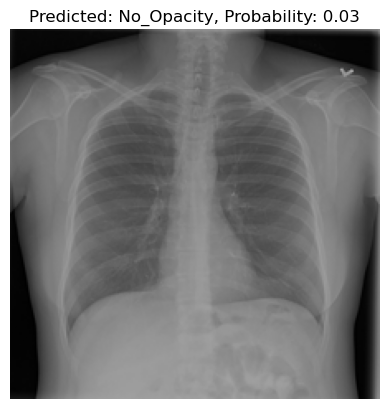

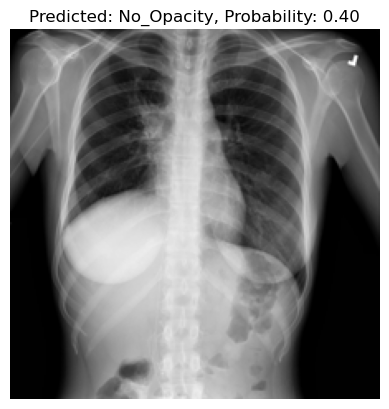

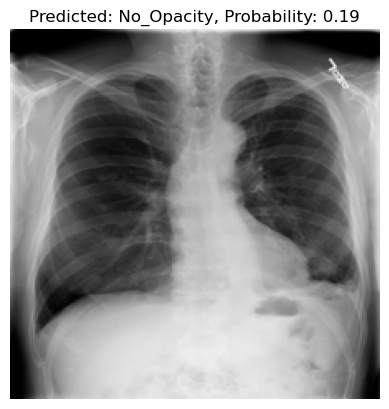

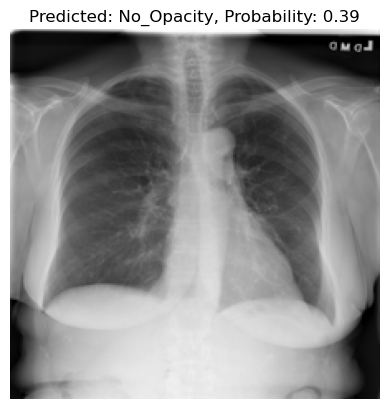

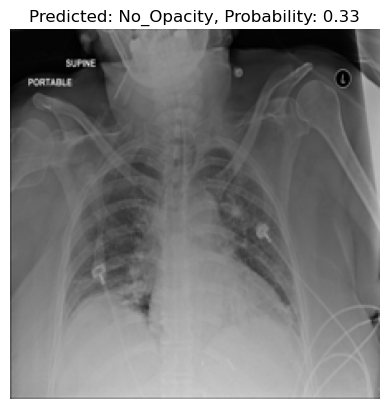

In [108]:
# Display a few test images along with their predicted labels and probabilit
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(5):
    img_path = test_df['filename'].iloc[i]
    img = mpimg.imread(img_path)
    predicted_label = binary_class_labels[predicted_classes[i]]
    opacity_prob = test_predictions[i][0]

    plt.imshow(img)
    plt.title(f"Predicted: {predicted_label}, Probability: {opacity_prob:.2f}")
    plt.axis('off')
    plt.show()


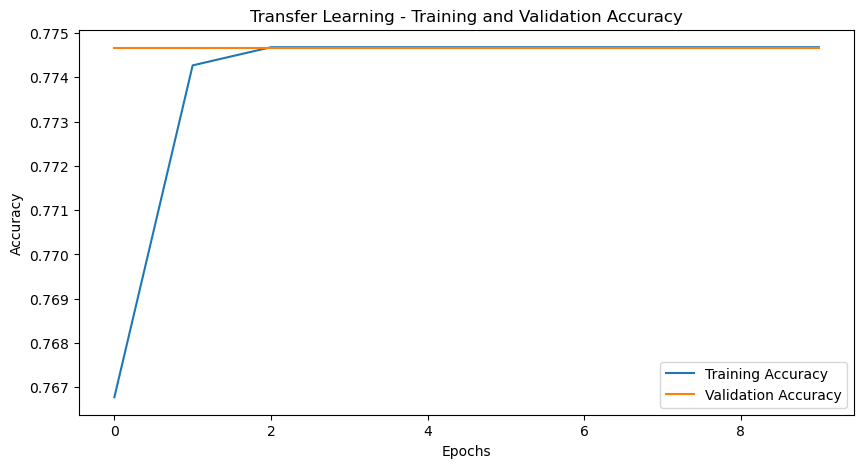

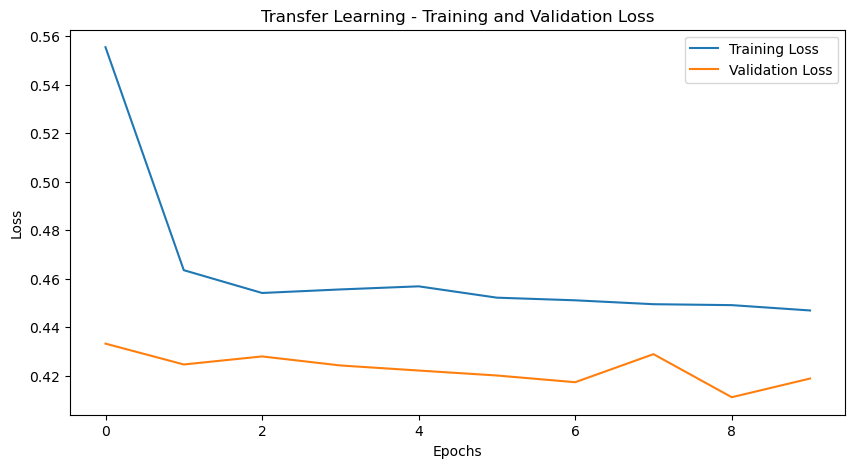

In [109]:
#Plot training vs. validation accuracy and loss.
import matplotlib.pyplot as plt

# Accuracy plot
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Transfer Learning - Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Loss plot
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Transfer Learning - Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [111]:
# Unfreeze top layers of the transfer learning model
base_model.trainable = True

# Compile the model again with a lower learning rate
transfer_learning_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Re-train the model
history = transfer_learning_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=5  # Adjust based on your need
)


Epoch 1/5
534/534 ━━━━━━━━━━━━━━━━━━━━ 4318s 8s/step - accuracy: 0.7746 - loss: 0.4668 - val_accuracy: 0.7747 - val_loss: 0.4262
Epoch 2/5
534/534 ━━━━━━━━━━━━━━━━━━━━ 4302s 8s/step - accuracy: 0.7758 - loss: 0.4516 - val_accuracy: 0.7747 - val_loss: 0.4235
Epoch 3/5
534/534 ━━━━━━━━━━━━━━━━━━━━ 5599s 10s/step - accuracy: 0.7692 - loss: 0.4584 - val_accuracy: 0.7747 - val_loss: 0.4235
Epoch 4/5
534/534 ━━━━━━━━━━━━━━━━━━━━ 2575s 5s/step - accuracy: 0.7753 - loss: 0.4468 - val_accuracy: 0.7747 - val_loss: 0.4246
Epoch 5/5
534/534 ━━━━━━━━━━━━━━━━━━━━ 2394s 4s/step - accuracy: 0.7708 - loss: 0.4548 - val_accuracy: 0.7747 - val_loss: 0.4237


In [112]:
transfer_learning_model.save('fine_tuned_transfer_learning_model.keras')
print("Model saved as 'fine_tuned_transfer_learning_model.keras'")

Model saved as 'fine_tuned_transfer_learning_model.keras'


**Step 3: RCNN and Hybrids**

**Design, train and test RCNN & its hybrids based object detection models to impose the bounding box or 
mask over the area of interest**.

In [ ]:
import os
import pandas as pd
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# --- Step 1: Reload Saved Paths and Files ---
# Paths for saved files
metadata_path = '/Users/aman/Desktop/metadata.csv'
fine_tuned_model_path = '/Users/aman/Desktop/fine_tuned_cnn_model.keras'
test_predictions_path = '/Users/aman/Desktop/test_predictions.csv'

# Directories for images
training_png_directory = '/Users/aman/Desktop/train_images224RGB2'
validation_png_directory = '/Users/aman/Desktop/val_images224RGB2'
testing_png_directory = '/Users/aman/Desktop/test_images224RGB2'

# Labels
binary_class_labels = ['No_Opacity', 'Opacity']

# Verify paths
required_paths = [
    metadata_path,
    fine_tuned_model_path,
    test_predictions_path,
    training_png_directory,
    validation_png_directory,
    testing_png_directory,
]

for path in required_paths:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Required path/file not found: {path}")
    else:
        print(f"Verified: {path}")

# --- Step 2: Load Model, Metadata, and Predictions ---
# Load the fine-tuned model
fine_tuned_model = load_model(fine_tuned_model_path)
print("Fine-tuned model loaded successfully.")

# Load metadata
metadata_df = pd.read_csv(metadata_path)
print(f"Metadata loaded successfully. Shape: {metadata_df.shape}")

# Load test predictions
test_df = pd.read_csv(test_predictions_path)
print(f"Test predictions loaded successfully. Shape: {test_df.shape}")

# --- Step 3: Prepare Test DataFrame ---
# Get all .png files from the testing directory
test_files = [os.path.join(testing_png_directory, f) for f in os.listdir(testing_png_directory) if f.endswith('.png')]

# Create a DataFrame for test files
test_df = pd.DataFrame({'filename': test_files})
print(f"Test DataFrame created. Shape: {test_df.shape}")

# --- Step 4: Reinitialize Data Generators ---
# Test Data Generator
test_datagen = ImageDataGenerator(rescale=1./255)

# Use the DataFrame for the generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col=None,  # No labels for testing
    target_size=(224, 224),
    batch_size=32,
    class_mode=None,
    shuffle=False
)

# --- Preprocess and Cast Data ---
def preprocess_generator(generator):
    """
    Preprocess the generator output to ensure correct dtype and format.
    Returns a NumPy array of all images.
    """
    all_images = []
    for batch in generator:
        # Ensure batch data is cast to float32
        batch = np.array(batch, dtype='float32')
        all_images.append(batch)
        # Stop after loading all images (required due to infinite loop nature of generators)
        if len(all_images) * generator.batch_size >= len(generator.filenames):
            break
    return np.vstack(all_images)  # Stack all batches into one array

# Preprocess the test generator
processed_test_data = preprocess_generator(test_generator)

# Debugging: Check preprocessed data
print(f"Processed Test Data Shape: {processed_test_data.shape}")
print(f"Processed Data Type: {processed_test_data.dtype}")
print(f"Min/Max Values: {processed_test_data.min()}, {processed_test_data.max()}")  

# --- Step 5: Make Predictions on Test Data ---
# Run predictions
predictions = fine_tuned_model.predict(processed_test_data, verbose=1)

# Convert probabilities to binary class labels
predicted_classes = (predictions > 0.5).astype(int).flatten()

# --- Step 6: Evaluate Model Performance ---
# Load true classes from the test DataFrame
true_classes = test_df['True_Class'] if 'True_Class' in test_df.columns else None

if true_classes is not None:
    # Classification report
    print("Classification Report:")
    print(classification_report(true_classes, predicted_classes, target_names=binary_class_labels))

    # Confusion matrix
    conf_matrix = confusion_matrix(true_classes, predicted_classes)
    print("Confusion Matrix:")
    print(conf_matrix)

# --- Step 7: Save Updated Test Predictions ---
# Update test predictions DataFrame
test_df['Predicted_Class'] = [binary_class_labels[i] for i in predicted_classes]
test_df['Probability'] = predictions.flatten()

# Save predictions to CSV
test_df.to_csv('/Users/aman/Desktop/updated_test_predictions.csv', index=False)
print("Updated predictions saved to '/Users/aman/Desktop/updated_test_predictions.csv'.")

# --- Step 8: Visualize Sample Predictions ---
# Visualize a few test predictions
for i in range(5):  # Display 5 random samples
    img_path = test_df['filename'].iloc[i]
    img = plt.imread(img_path)
    predicted_label = test_df['Predicted_Class'].iloc[i]
    prob = test_df['Probability'].iloc[i]

    plt.imshow(img)
    plt.title(f"Predicted: {predicted_label}\nProbability: {prob:.2f}")
    plt.axis('off')
    plt.show()


In [121]:
import os
import tensorflow as tf
from tensorflow.keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.utils import Sequence
import numpy as np
import pandas as pd

# --- Step 1: Define Data Generators ---
# Define constants
input_image_size = 224
batch_size = 32

# Define image data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # 20% for validation
)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    directory='/Users/aman/Desktop/train_images224RGB2',
    target_size=(input_image_size, input_image_size),
    batch_size=batch_size,
    class_mode='binary',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    directory='/Users/aman/Desktop/train_images224RGB2',
    target_size=(input_image_size, input_image_size),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation'
)

# --- Step 2: Define RCNN Model Architecture ---
input_layer = Input(shape=(224, 224, 3))

# Feature extraction layers
x = Conv2D(32, (3, 3), activation='relu')(input_layer)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

x = Flatten()(x)

# Fully connected layers
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output_layer = Dense(1, activation='sigmoid')(x)

# Define RCNN model
rcnn_model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
rcnn_model.compile(optimizer=Adam(learning_rate=1e-4),
                   loss='binary_crossentropy',
                   metrics=['accuracy'])

# Model summary
rcnn_model.summary()

# --- Step 3: Train RCNN Model ---
# Define callbacks
rcnn_checkpoint = ModelCheckpoint(
    'rcnn_model.keras',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Train the model
history = rcnn_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[rcnn_checkpoint, early_stopping]
)

print("RCNN model training completed. Saved as 'rcnn_model.keras'.")

# Save training history
pd.DataFrame(history.history).to_csv('/Users/aman/Desktop/rcnn_training_history.csv', index=False)


Found 17078 images belonging to 2 classes.
Found 4269 images belonging to 2 classes.


Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │      22,151,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,244,929 (84.86 MB)

 Trainable params: 22,244,929 (84.86 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 1214s 2s/step - accuracy: 0.7704 - loss: 0.5268 - val_accuracy: 0.7747 - val_loss: 0.5038
Epoch 2/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 1006s 2s/step - accuracy: 0.7775 - loss: 0.4784 - val_accuracy: 0.7859 - val_loss: 0.4518
Epoch 3/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 978s 2s/step - accuracy: 0.7901 - loss: 0.4571 - val_accuracy: 0.8053 - val_loss: 0.4559
Epoch 4/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 594s 1s/step - accuracy: 0.7861 - loss: 0.4641 - val_accuracy: 0.7950 - val_loss: 0.4479
Epoch 5/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 567s 993ms/step - accuracy: 0.7924 - loss: 0.4495 - val_accuracy: 0.8021 - val_loss: 0.4380
Epoch 6/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 512s 959ms/step - accuracy: 0.7938 - loss: 0.4534 - val_accuracy: 0.8000 - val_loss: 0.4342
Epoch 7/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 575s 983ms/step - accuracy: 0.8033 - loss: 0.4368 - val_accuracy: 0.8100 - val_loss: 0.4282
Epoch 8/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 566s 989ms/step - accuracy: 0.7913 - loss: 0.4

In [ ]:
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

# --- Step 1: Reload Test Data ---
input_image_size = 224
batch_size = 32
testing_png_directory = '/Users/aman/Desktop/test_images224RGB2'

# Verify test directory content
test_files = [f for f in os.listdir(testing_png_directory) if f.endswith('.png')]
if len(test_files) == 0:
    raise ValueError(f"No files found in {testing_png_directory}. Please check the directory content.")

# Create a DataFrame for test files
test_df = pd.DataFrame({'filename': [os.path.join(testing_png_directory, f) for f in test_files]})

# --- Step 2: Initialize Test Data Generator ---
test_datagen = ImageDataGenerator(rescale=1./255)

# Use the DataFrame for the generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col=None, 
    target_size=(input_image_size, input_image_size),
    batch_size=batch_size,
    class_mode=None,
    shuffle=False
)

# Debugging: Inspect generator output
batch = next(iter(test_generator))
print(f"Batch Shape: {batch.shape}")  
print(f"Batch Data Type: {batch.dtype}")
print(f"Batch Min/Max Values: {batch.min()}, {batch.max()}")

# --- Step 3: Load Trained RCNN Model ---
rcnn_model = tf.keras.models.load_model('rcnn_model.keras')
print("RCNN model loaded successfully.")
print(f"Model Input Shape: {rcnn_model.input_shape}")

# --- Step 4: Preprocess Test Data ---
def preprocess_generator(generator):
    """
    Preprocess the generator output to ensure compatibility with the model.
    Returns a NumPy array of all test images.
    """
    all_images = []
    for batch in generator:
        batch = np.array(batch, dtype='float32')  # Cast to float32
        all_images.append(batch)
        # Break after all images are loaded
        if len(all_images) * generator.batch_size >= len(generator.filenames):
            break
    return np.vstack(all_images)  # Stack batches into a single array

processed_test_data = preprocess_generator(test_generator)

# Debugging: Check preprocessed data
print(f"Processed Test Data Shape: {processed_test_data.shape}")
print(f"Processed Data Type: {processed_test_data.dtype}")
print(f"Min/Max Values: {processed_test_data.min()}, {processed_test_data.max()}")

# --- Step 5: Run Predictions ---
try:
    test_predictions = rcnn_model.predict(processed_test_data, verbose=1)
except Exception as e:
    print("Error during prediction:", e)
    raise

# Convert probabilities to binary class labels
predicted_classes = (test_predictions > 0.5).astype(int).flatten()

# --- Step 6: Save Predictions ---
test_filenames = test_df['filename'].values  # Get filenames
predictions_df = pd.DataFrame({
    'Filename': test_filenames,
    'Predicted_Class': predicted_classes,
    'Probability': test_predictions.flatten()
})

# Save predictions
predictions_csv_path = '/Users/aman/Desktop/rcnn_test_predictions.csv'
predictions_df.to_csv(predictions_csv_path, index=False)
print(f"Predictions saved to {predictions_csv_path}")

# --- Step 7: Visualize Predictions ---
for i in range(5):  # Display 5 random samples
    img_path = test_filenames[i]
    img = plt.imread(img_path)
    predicted_label = "Opacity" if predicted_classes[i] == 1 else "No_Opacity"
    prob = test_predictions[i][0]

    plt.imshow(img)
    plt.title(f"Predicted: {predicted_label}\nProbability: {prob:.2f}")
    plt.axis('off')
    plt.show()

# --- Step 8: Evaluate Model (Optional, if true labels exist) ---
if 'True_Class' in test_df.columns:
    true_classes = test_df['True_Class']
    print("Classification Report:")
    print(classification_report(true_classes, predicted_classes, target_names=["No_Opacity", "Opacity"]))
    
    conf_matrix = confusion_matrix(true_classes, predicted_classes)
    print("Confusion Matrix:")
    print(conf_matrix)


In [137]:
import pandas as pd

# Convert train_annotations_dict to a DataFrame
train_annotations = pd.DataFrame([
    {'patientId': pid, 'bboxes': bboxes}
    for pid, bboxes in train_annotations_dict.items()
])

# Convert test_annotations_dict to a DataFrame (if needed)
val_annotations = pd.DataFrame([
    {'patientId': pid, 'bboxes': bboxes}
    for pid, bboxes in test_annotations_dict.items()
])

# Print the shapes and some sample data
print(f"Training Annotations Shape: {train_annotations.shape}")
print(f"Validation Annotations Shape: {val_annotations.shape}")
print(train_annotations.head())
print(val_annotations.head())


Training Annotations Shape: (6012, 2)
Validation Annotations Shape: (3000, 2)
                              patientId  \
0  000db696-cf54-4385-b10b-6b16fbb3f985   
1  000fe35a-2649-43d4-b027-e67796d412e0   
2  001031d9-f904-4a23-b3e5-2c088acd19c6   
3  001916b8-3d30-4935-a5d1-8eaddb1646cd   
4  0022073f-cec8-42ec-ab5f-bc2314649235   

                                              bboxes  
0  [[316.0, 318.0, 170.0, 478.0], [660.0, 375.0, ...  
1  [[570.0, 282.0, 269.0, 409.0], [83.0, 227.0, 2...  
2  [[66.0, 160.0, 373.0, 608.0], [552.0, 164.0, 3...  
3                     [[198.0, 375.0, 114.0, 206.0]]  
4  [[575.0, 232.0, 246.0, 528.0], [161.0, 230.0, ...  
                              patientId                             bboxes
0  0000a175-0e68-4ca4-b1af-167204a7e0bc  [[0.5, 0.0, 0.0, 100.0], [100.0]]
1  0005d3cc-3c3f-40b9-93c3-46231c3eb813  [[0.5, 0.0, 0.0, 100.0], [100.0]]
2  000686d7-f4fc-448d-97a0-44fa9c5d3aa6  [[0.5, 0.0, 0.0, 100.0], [100.0]]
3  000e3a7d-c0ca-4349-bb26-5af2d8

In [170]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import Sequence
import cv2
import os

class CustomDataGenerator(Sequence):
    def __init__(self, annotations, img_dir, batch_size, target_size=(224, 224), shuffle=True):
        self.annotations = annotations
        self.img_dir = img_dir
        self.batch_size = batch_size
        self.target_size = target_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.annotations) / self.batch_size))

    def __getitem__(self, index):
        # Get batch annotations
        batch_annotations = self.annotations.iloc[index * self.batch_size:(index + 1) * self.batch_size]

        # Initialize arrays for images and bounding boxes
        X = np.zeros((len(batch_annotations), *self.target_size, 3), dtype=np.float32)
        y = []

        for i, row in enumerate(batch_annotations.itertuples()):
            img_path = os.path.join(self.img_dir, f"{row.patientId}.png")
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.resize(img, self.target_size)
                X[i] = img / 255.0  # Normalize the image
                y.append(row.bboxes)

        return X, np.array(y)

    def on_epoch_end(self):
        if self.shuffle:
            self.annotations = self.annotations.sample(frac=1).reset_index(drop=True)


In [171]:
import pandas as pd
from sklearn.model_selection import train_test_split

train_annotations.to_csv('/Users/aman/Desktop/train_annotations.csv', index=False)
val_annotations.to_csv('/Users/aman/Desktop/val_annotations.csv', index=False)

print("Train and validation annotations saved.")

train_annotations = pd.read_csv('/Users/aman/Desktop/train_annotations.csv')
val_annotations = pd.read_csv('/Users/aman/Desktop/val_annotations.csv')

print(f"Loaded Train Annotations Shape: {train_annotations.shape}")
print(f"Loaded Validation Annotations Shape: {val_annotations.shape}")



# Split into training and validation sets
train_annotations, val_annotations = train_test_split(
    train_annotations, test_size=0.2, random_state=42
)

# Debug: Check the split
print(f"Train Annotations Shape: {train_annotations.shape}")
print(f"Validation Annotations Shape: {val_annotations.shape}")

# Define batch size
batch_size = 16

# Initialize generators
train_generator = CustomDataGenerator(train_annotations, train_dir, batch_size)
val_generator = CustomDataGenerator(val_annotations, val_dir, batch_size)

# Debug: Check generator outputs
sample_batch = next(iter(train_generator))
print(f"Sample Batch Shape: {sample_batch[0].shape}, Labels Shape: {sample_batch[1].shape}")


Train and validation annotations saved.
Loaded Train Annotations Shape: (4809, 2)
Loaded Validation Annotations Shape: (0, 2)
Train Annotations Shape: (3847, 2)
Validation Annotations Shape: (962, 2)
Sample Batch Shape: (16, 224, 224, 3), Labels Shape: (0,)


In [42]:
# Debug: Check a batch from the generator
X, y = train_generator[0]
print(f"Batch Shape (Images): {X.shape}")  
print(f"Batch Shape (Bounding Boxes): {y.shape}")

Batch Shape (Images): (32, 224, 224, 3)
Batch Shape (Bounding Boxes): (32,)


In [173]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense

# Define input layer
input_layer = Input(shape=(224, 224, 3))

# Feature extraction
x = Conv2D(32, (3, 3), activation='relu')(input_layer)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Flatten()(x)

# Output layer for bounding boxes
bbox_output = Dense(4, activation='sigmoid', name="bbox")(x)

# Define model
rcnn_model = Model(inputs=input_layer, outputs=bbox_output)
rcnn_model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

rcnn_model.summary()


Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bbox (Dense)                         │ (None, 4)                   │         746,500 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 765,892 (2.92 MB)

 Trainable params: 765,892 (2.92 MB)

 Non-trainable params: 0 (0.00 B)

In [155]:
print(f"val_predictions shape: {val_predictions.shape}")
print(f"Number of batches in val_generator: {len(val_generator)}")


val_predictions shape: (1203, 4)
Number of batches in val_generator: 76


In [205]:
print(f"Validation Annotations Shape: {val_annotations.shape}")
print(val_annotations.head())

# Check how many rows have non-empty bounding boxes
non_empty_bboxes_count = val_annotations['bboxes'].apply(lambda x: len(ast.literal_eval(x)) if isinstance(x, str) else len(x)).sum()
print(f"Number of bounding boxes in validation annotations: {non_empty_bboxes_count}")


Validation Annotations Shape: (962, 2)
                                 patientId  \
1448  13acd418-a94d-4b36-900d-c13b9bd048c9   
2932  3282f02d-965e-4da5-acf7-b3d8e8154a31   
794   c2abea3d-e666-4be3-a0d9-352e980c13c8   
1029  aead3682-bdf4-4f43-8468-8e6ac3cd41fa   
8     3c319790-02cd-44d7-bb91-8e758463ac82   

                                                 bboxes  
1448  [[186.0, 247.0, 176.0, 296.0], [555.0, 313.0, ...  
2932  [[305.0, 235.0, 126.0, 325.0], [624.0, 356.0, ...  
794   [[265.0, 114.0, 198.0, 668.0], [646.0, 142.0, ...  
1029                     [[591.0, 382.0, 212.0, 276.0]]  
8                        [[618.0, 149.0, 324.0, 659.0]]  
Number of bounding boxes in validation annotations: 1512


In [215]:
# Generate predictions and store patientId with predictions
val_predictions = rcnn_model.predict(val_generator, verbose=1)

# Store patientIds and predictions together
val_predictions_with_id = pd.DataFrame({
    'patientId': val_annotations['patientId'].values[:len(val_predictions)],
    'predictions': val_predictions.tolist()
})

# Debugging: Check the generated DataFrame
print(val_predictions_with_id.head())


61/61 ━━━━━━━━━━━━━━━━━━━━ 24s 397ms/step
                              patientId           predictions
0  13acd418-a94d-4b36-900d-c13b9bd048c9  [0.5, 0.5, 0.5, 0.5]
1  3282f02d-965e-4da5-acf7-b3d8e8154a31  [0.5, 0.5, 0.5, 0.5]
2  c2abea3d-e666-4be3-a0d9-352e980c13c8  [0.5, 0.5, 0.5, 0.5]
3  aead3682-bdf4-4f43-8468-8e6ac3cd41fa  [0.5, 0.5, 0.5, 0.5]
4  3c319790-02cd-44d7-bb91-8e758463ac82  [0.5, 0.5, 0.5, 0.5]


In [216]:
true_bboxes_flat = []
predicted_bboxes_flat = []

# Create a dictionary mapping patientId to predictions
predictions_mapping = dict(zip(val_predictions_with_id['patientId'], val_predictions_with_id['predictions']))

processed_rows = 0
skipped_rows = 0

for idx, row in val_annotations.iterrows():
    patient_id = row['patientId']
    bboxes = row['bboxes']

    if isinstance(bboxes, str):
        import ast
        bboxes = ast.literal_eval(bboxes)

    if len(bboxes) > 0:  # Process only if there are bounding boxes
        true_bboxes_flat.extend([coord for bbox in bboxes for coord in bbox])

        # Align predictions with bounding boxes using patientId
        if patient_id in predictions_mapping:
            pred = predictions_mapping[patient_id]
            pred_repeated = [pred] * len(bboxes)
            predicted_bboxes_flat.extend([coord for bbox in pred_repeated for coord in bbox])
            processed_rows += 1
        else:
            skipped_rows += 1
            print(f"Skipping patientId={patient_id}: No matching prediction.")
    else:
        skipped_rows += 1
        print(f"Skipping patientId={patient_id}: No bounding boxes.")

# Debugging
print(f"Processed Rows: {processed_rows}, Skipped Rows: {skipped_rows}")
print(f"True Bounding Boxes Flattened Length: {len(true_bboxes_flat)}")
print(f"Predicted Bounding Boxes Flattened Length: {len(predicted_bboxes_flat)}")


Processed Rows: 962, Skipped Rows: 0
True Bounding Boxes Flattened Length: 6048
Predicted Bounding Boxes Flattened Length: 6048


In [217]:
from sklearn.metrics import mean_squared_error

# Compute Mean Squared Error (MSE)
mse = mean_squared_error(true_bboxes_flat, predicted_bboxes_flat)
print(f"Mean Squared Error (MSE) for bounding boxes: {mse}")


Mean Squared Error (MSE) for bounding boxes: 134532.83994708996


In [239]:
color_mode = 'RGB'  # or 'L' for grayscale
class_count = 2
unique_identifier = str(input_image_size) + color_mode + str(class_count)


In [228]:
import os

# Check the directory content
print(f"Validation directory: {validation_png_directory}")
print(f"Number of images in validation directory: {len(os.listdir(validation_png_directory))}")
print(f"Sample images: {os.listdir(validation_png_directory)[:5]}")


Validation directory: val_images224RGB2
Number of images in validation directory: 2
Sample images: ['No_Opacity', 'Opacity']


In [265]:
# Save true and predicted bounding boxes to a CSV for reference
results_df = pd.DataFrame({
    "True_BBoxes": true_bboxes_flat,
    "Predicted_BBoxes": predicted_bboxes_flat
})
results_df.to_csv("bounding_box_results.csv", index=False)
print("Bounding box results saved to 'bounding_box_results.csv'.")


Bounding box results saved to 'bounding_box_results.csv'.


In [ ]:
# Save predictions to CSV
predictions_df = pd.DataFrame({
    'patientId': val_annotations['patientId'],
    'True_Bboxes': val_annotations['bboxes'],
    'Predicted_Bboxes': val_predictions.tolist()
})

output_csv_path = '/Users/aman/Desktop/val_predictions.csv'
predictions_df.to_csv(output_csv_path, index=False)

print(f"Validation predictions saved to {output_csv_path}")


In [267]:
rcnn_model.save('rcnn_model.keras')
print("RCNN model saved as 'rcnn_model.keras'.")


RCNN model saved as 'rcnn_model.keras'.


In [304]:
# Extract bounding boxes from `train_annotations_dict`
def extract_bounding_boxes_from_dict(patient_ids, annotations_dict):
    """
    Extract bounding boxes for a given list of patient IDs from the annotations dictionary.
    """
    bboxes = []
    for pid in patient_ids:
        bboxes.extend(annotations_dict.get(pid, []))
    return bboxes

# Extract training and validation bounding boxes
true_bboxes_flat = extract_bounding_boxes_from_dict(train_files, train_annotations_dict)
predicted_bboxes_flat = extract_bounding_boxes_from_dict(val_files, train_annotations_dict)  # For validation


In [305]:
def calculate_iou(box1, box2):
    """
    Calculate IoU between two bounding boxes.
    """
    x1_inter = max(box1[0], box2[0])
    y1_inter = max(box1[1], box2[1])
    x2_inter = min(box1[0] + box1[2], box2[0] + box2[2])
    y2_inter = min(box1[1] + box1[3], box2[1] + box2[3])

    if x1_inter < x2_inter and y1_inter < y2_inter:
        intersection = (x2_inter - x1_inter) * (y2_inter - y1_inter)
    else:
        intersection = 0

    box1_area = box1[2] * box1[3]
    box2_area = box2[2] * box2[3]
    union = box1_area + box2_area - intersection
    iou = intersection / union if union > 0 else 0
    return iou

# Compute IoU for all pairs of true and predicted bounding boxes
iou_scores = [
    calculate_iou(true, pred)
    for true, pred in zip(true_bboxes_flat, predicted_bboxes_flat)
]
print(f"Average IoU: {np.mean(iou_scores):.2f}")


Average IoU: 0.11


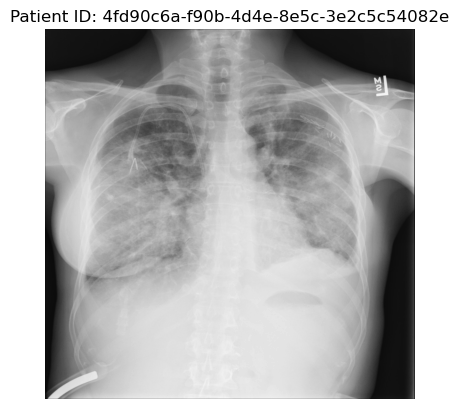

In [306]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def visualize_bounding_boxes(patient_id, annotations_dict, image_dir):
    """
    Visualize an image with its bounding boxes.
    """
    dicom_image = dcmread(os.path.join(image_dir, patient_id + '.dcm'))
    image_array = dicom_image.pixel_array

    plt.imshow(image_array, cmap='gray')
    bboxes = annotations_dict.get(patient_id, [])
    for bbox in bboxes:
        x, y, w, h = bbox
        plt.gca().add_patch(Rectangle((x, y), w, h, edgecolor='red', facecolor='none', linewidth=2))
    plt.title(f"Patient ID: {patient_id}")
    plt.axis('off')
    plt.show()

# Example visualization for a random training patient
random_patient_id = np.random.choice(train_files)
visualize_bounding_boxes(random_patient_id, train_annotations_dict, nested_train_images_dir)


In [307]:
for true_bbox, pred_bbox in zip(true_bboxes_flat[:5], predicted_bboxes_flat[:5]):
    print(f"True: {true_bbox}, Predicted: {pred_bbox}")


True: [168.0, 362.0, 153.0, 170.0], Predicted: [308.0, 465.0, 189.0, 293.0]
True: [576.0, 224.0, 182.0, 135.0], Predicted: [219.0, 673.0, 175.0, 232.0]
True: [103.0, 35.0, 200.0, 461.0], Predicted: [626.0, 774.0, 125.0, 160.0]
True: [406.0, 32.0, 389.0, 444.0], Predicted: [302.0, 346.0, 174.0, 214.0]
True: [554.0, 529.0, 240.0, 320.0], Predicted: [344.0, 550.0, 115.0, 144.0]


**Step 3: Improved RCNN Implementation**

In [311]:
# Scale bounding boxes to match the resized image dimensions
def scale_bounding_boxes(bboxes, scaling_factor):
    """
    Scale bounding boxes to match resized image dimensions.
    """
    return [[x * scaling_factor, y * scaling_factor, w * scaling_factor, h * scaling_factor] for x, y, w, h in bboxes]

# Scale ground truth and predicted bounding boxes 
original_image_size = 1024
input_image_size = 224
scaling_factor = input_image_size / original_image_size

true_bboxes_scaled = scale_bounding_boxes(true_bboxes_flat, scaling_factor)
pred_bboxes_scaled = scale_bounding_boxes(predicted_bboxes_flat, scaling_factor)


In [312]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, Input, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras.models import Model

def build_rcnn(input_shape=(224, 224, 3)):
    """
    Build an RCNN model using a pre-trained ResNet50 backbone.
    """
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the backbone layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom layers for object detection
    x = base_model.output
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)

    # Bounding box regression output
    bbox_output = Dense(4, activation='linear', name='bbox_output')(x)

    # Classification output
    class_output = Dense(1, activation='sigmoid', name='class_output')(x)

    # Combine into a single model
    model = Model(inputs=base_model.input, outputs=[bbox_output, class_output])
    return model

# Build the model
rcnn_model = build_rcnn()

# Compile the model
rcnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss={
        'bbox_output': 'mse',  # Mean squared error for bounding box regression
        'class_output': 'binary_crossentropy'  # Binary crossentropy for classification
    },
    metrics={
        'bbox_output': 'mae',  # Mean absolute error for bounding boxes
        'class_output': 'accuracy'  # Accuracy for classification
    }
)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


In [32]:
print(f"Model Output Shape: {rcnn_model.output_shape}")


Model Output Shape: (None, 4)


In [ ]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path to the saved model
model_path = '/Users/aman/Desktop/rcnn_model.keras'

# Check if the model file exists
if not os.path.exists(model_path):
    raise FileNotFoundError(f"Model file not found at: {model_path}. Ensure the model is saved during training.")

# Load the saved RCNN model
rcnn_model = load_model(model_path)
print("Model loaded successfully!")
print(f"Expected Model Input Shape: {rcnn_model.input_shape}")
print(f"Model Output Shape: {rcnn_model.output_shape}")

# Define test image directory
test_images_dir = '/Users/aman/Desktop/test_images224RGB2'

# Verify test directory content
test_files = [f for f in os.listdir(test_images_dir) if f.endswith('.png')]
if len(test_files) == 0:
    raise ValueError(f"No files found in {test_images_dir}. Please check the directory content.")

# Create a DataFrame for test files
test_df = pd.DataFrame({'filename': [os.path.join(test_images_dir, f) for f in test_files]})
print(f"Test DataFrame created with {len(test_df)} files.")

# Define test data generator
test_datagen = ImageDataGenerator(rescale=1./255)

# Use the DataFrame for the generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filename',
    y_col=None,  
    target_size=(224, 224),  
    batch_size=32,           
    class_mode=None,         
    shuffle=False
)

# Preprocess images manually into a NumPy array
all_images = []
for i in range(len(test_generator)):
    batch = test_generator[i]  # Load batch of images
    all_images.append(batch)
    if len(all_images) * test_generator.batch_size >= len(test_generator.filenames):
        break

processed_test_data = np.vstack(all_images)  # Combine all batches into a single NumPy array
print(f"Processed Test Data Shape: {processed_test_data.shape}")

# Generate predictions
test_predictions = rcnn_model.predict(processed_test_data, verbose=1)

# Handle multi-class predictions
predicted_classes = np.argmax(test_predictions, axis=1)  # Get the index of the max probability for each image
predicted_probabilities = np.max(test_predictions, axis=1)  # Get the max probability for each image

# Debugging: Check the lengths
print(f"Number of test files: {len(test_df)}")
print(f"Number of predictions: {len(predicted_classes)}")

# Alignment of filenames and predictions
if len(test_df) != len(predicted_classes):
    raise ValueError("Mismatch between the number of test files and predictions.")

# Save predictions to a CSV file
test_filenames = [os.path.basename(f) for f in test_df['filename']]  # Extract base filenames
predictions_df = pd.DataFrame({
    'Filename': test_filenames,
    'Predicted_Class': predicted_classes,
    'Probability': predicted_probabilities
})
test_predictions_path = '/Users/aman/Desktop/test_predictions.csv'
predictions_df.to_csv(test_predictions_path, index=False)
print(f"Test predictions saved to {test_predictions_path}")


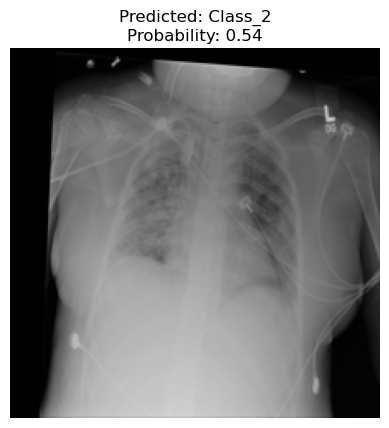

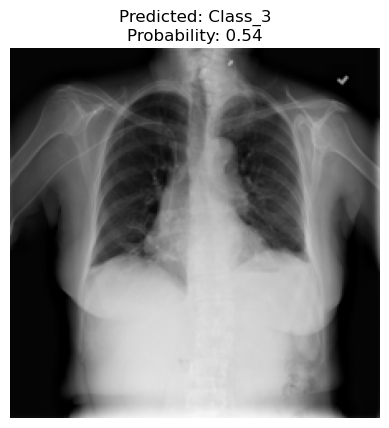

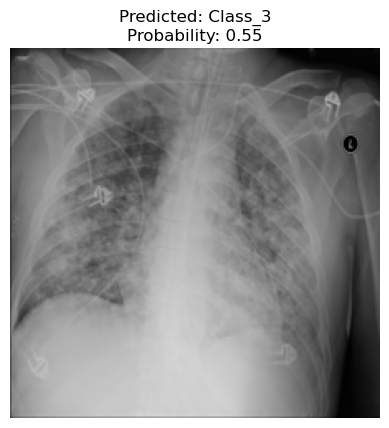

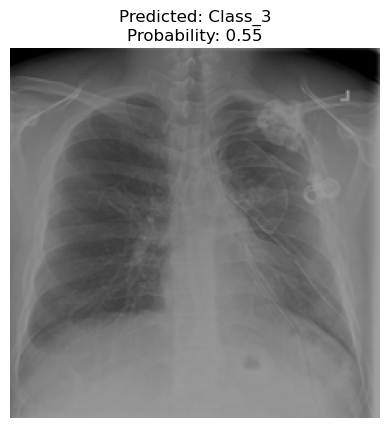

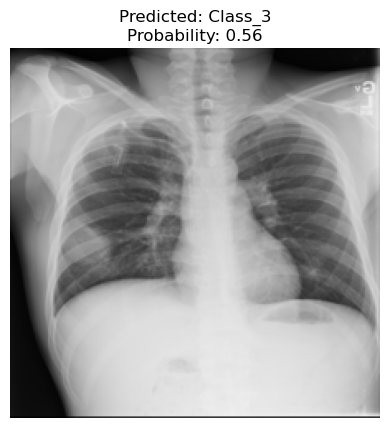

In [34]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import pandas as pd
import os

# Load the predictions
predictions_csv_path = '/Users/aman/Desktop/test_predictions.csv'
predictions_df = pd.read_csv(predictions_csv_path)

# Define the class labels 
class_labels = ['Class_0', 'Class_1', 'Class_2', 'Class_3']

# Visualization function
def visualize_predictions(predictions_df, test_images_dir, class_labels, num_samples=5):
    """
    Visualize predictions with images.
    """
    # Select random samples
    sample_predictions = predictions_df.sample(n=num_samples)
    
    for _, row in sample_predictions.iterrows():
        img_path = os.path.join(test_images_dir, row['Filename'])
        predicted_class = row['Predicted_Class']
        probability = row['Probability']

        # Load the image
        img = mpimg.imread(img_path)

        # Display the image
        plt.imshow(img)
        plt.title(f"Predicted: {class_labels[predicted_class]}\nProbability: {probability:.2f}")
        plt.axis('off')
        plt.show()

# Call the visualization function
visualize_predictions(predictions_df, test_images_dir='/Users/aman/Desktop/test_images224RGB2', class_labels=class_labels, num_samples=5)


In [2]:
# Define paths for saved files and directories
input_image_size = 224  # Resize images to 224x224
batch_size = 32         # Batch size for data generators

# Directories for images
training_png_directory = '/Users/aman/Desktop/train_images224RGB2'
validation_png_directory = '/Users/aman/Desktop/val_images224RGB2'
testing_png_directory = '/Users/aman/Desktop/test_images224RGB2'

# Paths for saved files
rcnn_model_path = 'rcnn_model.keras'  # Path to the trained RCNN model
rcnn_training_history_path = '/Users/aman/Desktop/rcnn_training_history.csv'  # Training history
test_predictions_path = '/Users/aman/Desktop/test_predictions.csv'  # Save test predictions

# Labels
binary_class_labels = ['No_Opacity', 'Opacity']


**Step 4 : Pickle the model for future prediction**

In [ ]:
# Step 4: Pickle the Fine-Tuned Model for Future Predictions

import pickle
from tensorflow.keras.models import load_model

# Define paths
fine_tuned_model_path = '/Users/aman/Desktop/fine_tuned_cnn_model.keras'
fine_tuned_pickle_path = '/Users/aman/Desktop/fine_tuned_transfer_learning_model.pkl'
rcnn_pickle_path = '/Users/aman/Desktop/rcnn_model.pkl'

# Load and verify the fine-tuned model
try:
    fine_tuned_model = load_model(fine_tuned_model_path)
    print(f"Fine-tuned transfer learning model loaded from {fine_tuned_model_path}")
except FileNotFoundError:
    print(f"Fine-tuned transfer learning model not found at {fine_tuned_model_path}. Please ensure it exists.")

# Save the RCNN model
if 'rcnn_model' in locals():
    with open(rcnn_pickle_path, 'wb') as f:
        pickle.dump(rcnn_model, f)
    print(f"RCNN model saved as pickle at {rcnn_pickle_path}")
else:
    print("RCNN model not defined. Please ensure the `rcnn_model` variable is initialized.")

# Save the Fine-Tuned Transfer Learning model
if 'fine_tuned_model' in locals():
    with open(fine_tuned_pickle_path, 'wb') as f:
        pickle.dump(fine_tuned_model, f)
    print(f"Fine-tuned transfer learning model saved as pickle at {fine_tuned_pickle_path}")
else:
    print("Fine-tuned transfer learning model not loaded. Cannot save as pickle.")
